In [6]:
# Convertimos a dataframe
df_protons = protons_tel_events_f.to_pandas()
print(df_protons.shape)
df_protons = df_protons.dropna()
df_protons = df_protons[(df_protons['hillas_intensity']>200)]
print(df_protons.shape)

df_gamma = gamma_tel_events_f.to_pandas()
print(df_gamma.shape)
df_gamma = df_gamma.dropna()
df_gamma = df_gamma[(df_gamma['hillas_intensity']>200)]
print(df_gamma.shape)

# Juntamos los dos dataframe
df_protongamma = pd.concat([df_protons, df_gamma], axis=0)

# Creamos la etiqueta para que el modelo pueda comprobar sus resultados
label = []                                                                                             
for i in range(len(df_protons)):
    label.append(1)                                                                   # Nombramos los protones como 1
for j in range(len(df_gamma)):
    label.append(0)                                                                   # Nombramos los gamma como 0
    
df_protongamma.insert(6,"label", label, True)

X = df_protongamma.drop("label", axis=1)                                              # Determina los parámetros 
y = df_protongamma["label"]

print(len(y))

(1022655, 6)
(424996, 6)
(1092671, 6)
(438922, 6)
863918


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctapipe.io import TableLoader

# RandomForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split

# Distribución del clasificador
import scipy.stats as stats

# Cargamos imágenes SIMULADAS
with TableLoader("../datos/proton.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=1647471)
with TableLoader("../datos/gamma-diffuse.dl2.h5", load_dl1_images=True,load_dl2=True, load_simulated=True) as loader_g:
    gamma_tel_events = loader_g.read_telescope_events("LST_LST_LSTCam", start=0, stop=1452118)

# Determinamos los parámetros (ahora vamos a escoger todos (menos los ID) para ver cuáles son los más relevantes y ver si el modelo mejora)
features = [
 #'obs_id',
 #'event_id',                          
 #'tel_id',
 'hillas_intensity',
 'hillas_skewness',
 'hillas_kurtosis',
 #'hillas_r',
 #'hillas_phi',
 'hillas_length',
 'hillas_width',
 #'hillas_psi',
 #'timing_intercept',
 #'timing_deviation',
 'timing_slope',
 #'leakage_intensity_width_2',
 #'true_energy'
]

protons_tel_events_f = protons_tel_events[features] 
gamma_tel_events_f=gamma_tel_events[features]

# Convertimos a dataframe
df_protons = protons_tel_events_f.to_pandas()
df_protons = df_protons.dropna()
df_protons = df_protons[(df_protons['hillas_intensity']>200)]

df_gamma = gamma_tel_events_f.to_pandas()
df_gamma = df_gamma.dropna()
df_gamma = df_gamma[(df_gamma['hillas_intensity']>200)]

# Juntamos los dos dataframe
df_protongamma = pd.concat([df_protons, df_gamma], axis=0)

# Creamos la etiqueta para que el modelo pueda comprobar sus resultados
label = []                                                                                             
for i in range(len(df_protons)):
    label.append(1)                                                                   # Nombramos los protones como 1
for j in range(len(df_gamma)):
    label.append(0)                                                                   # Nombramos los gamma como 0
    
df_protongamma.insert(6,"label", label, True)

X = df_protongamma.drop("label", axis=1)                                              # Determina los parámetros 
y = df_protongamma["label"]

In [4]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
rfh = RandomForestClassifier(max_depth=19, n_estimators=150)
rfh.fit(X_train, y_train)

RandomForestClassifier(max_depth=19, n_estimators=150)

In [ ]:
y_pred = (rfh.predict_proba(X_test))
proba = y_pred[:,0]                                                                             # Probabilidad de que el suceso sea un gamma
label = y_test                                                                                   # Etiqueta real del suceso
    
# Asignamos a cada probabilidad que devuelve el RF la etiqueta real del suceso
prob_gamma = proba[label == 0]
prob_proton = proba[label == 1]

plt.hist(prob_gamma, bins=50, histtype=u'step', label='Gamma')  
#plt.plot(xg, densityg(xg))

plt.hist(prob_proton, bins=50, histtype=u'step', label='Hadrón')  
#plt.plot(xp, densityph(xp))

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Gammaness")
plt.ylabel('Frecuencia absoluta')
plt.legend(loc='upper center')
plt.savefig('Distribución.png')
plt.show()

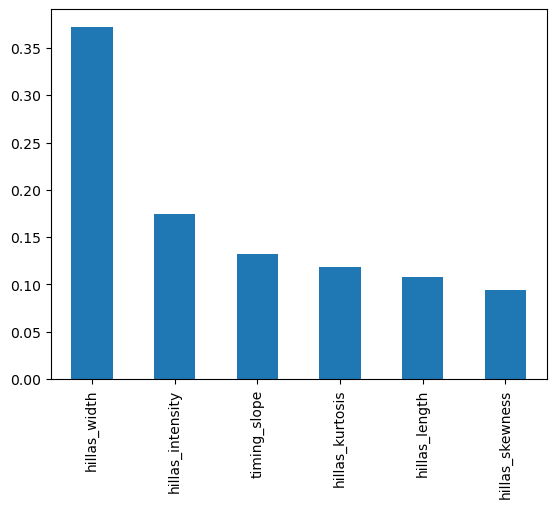

hillas_width        0.372182
hillas_intensity    0.174928
timing_slope        0.131989
hillas_kurtosis     0.118568
hillas_length       0.107849
hillas_skewness     0.094484
dtype: float64


In [5]:
feature_importances = pd.Series(rfh.feature_importances_, index=X_train.columns).sort_values(ascending=False)
feature_importances.plot.bar()
plt.show()

print(feature_importances)

In [51]:
thresholds = np.arange(0, 1.01, 0.01)

# Creamos los arrays que van a representar nuestros valores:
TP = []
FN = []
FP = []
TN = []
total = []
T = []
F = []
TPRp=[]                                                                       # Para protones
FPRp=[]
TPRg=[]                                                                       # Para gammas
FPRg=[]
accuracy = []

for threshold in thresholds:
    y_pred = (rfh.predict_proba(X_test)[:,1]>threshold).astype("float")
    cm = confusion_matrix(y_test, y_pred)
    
    TPi=cm[1,1]
    FNi=cm[1,0]
    FPi=cm[0,1]
    TNi=cm[0,0]
    
    totali = TPi + TNi + FNi + FPi
    TPRpi=TPi/(TPi+FNi)
    FPRpi=FPi/(FPi+TNi)
    TPRgi=TNi/(TNi+FPi)
    FPRgi=FNi/(FNi+TPi)
    accuracyi = accuracy_score(y_test, y_pred)
    
    if abs(TPi-TNi) < 2500:                                                       # Deveulve el umbral para cual se maximizan el número de TP Y TN
        print("Umbral que maximiza TP y TN:", threshold)
    elif abs(FPi-FNi) < 2500:                                                     # Deveulve el umbral para cual se minimizan el número de FP Y FN
        print("Umbral que minimiza FP y FN:", threshold) 
        
    TP.append(TPi)
    FN.append(FNi)
    FP.append(FPi)
    TN.append(TNi)
    total.append(totali)
    TPRp.append(TPRpi)
    FPRp.append(FPRpi)
    TPRg.append(TPRgi)
    FPRg.append(FPRgi)
    accuracy.append(accuracyi)
    T.append(TPi+TNi)
    F.append(FPi+FNi)

Umbral que maximiza TP y TN: 0.47000000000000003
Umbral que maximiza TP y TN: 0.48
Umbral que maximiza TP y TN: 0.49
Umbral que minimiza FP y FN: 0.5
Umbral que minimiza FP y FN: 0.51


In [52]:
max_value = max(accuracy)
max_index = accuracy.index(max_value)

print(max_value, max_index)

0.7967450689878692 51


In [53]:
max_value = max(T)
max_index = T.index(max_value)

print(max_value, max_index)

172081 51


In [56]:
min_value = min(F)
min_index = F.index(min_value)

print(min_value, min_index)

43899 51


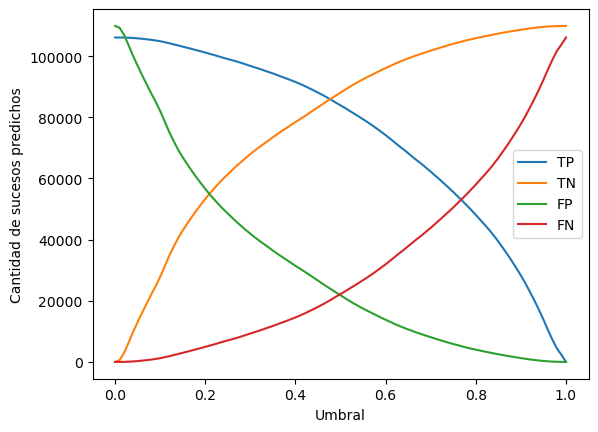

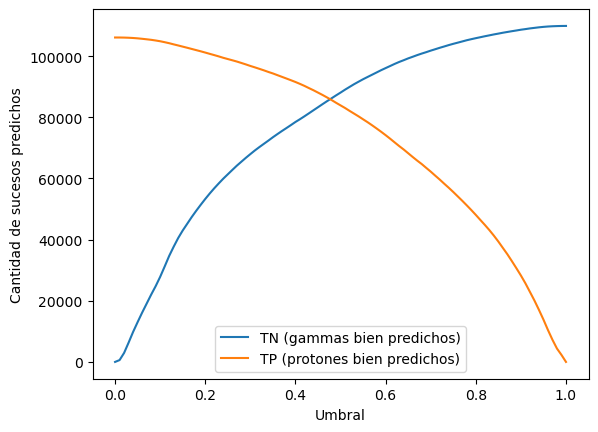

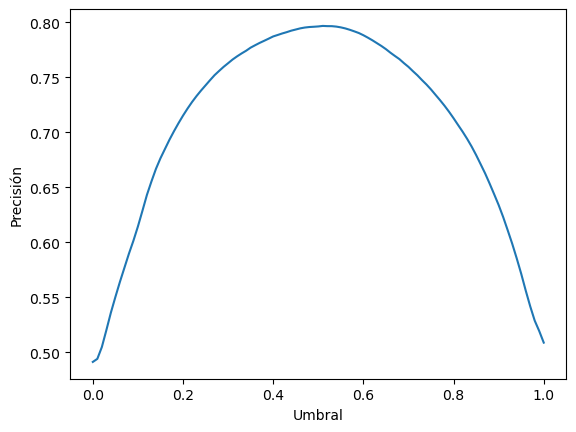

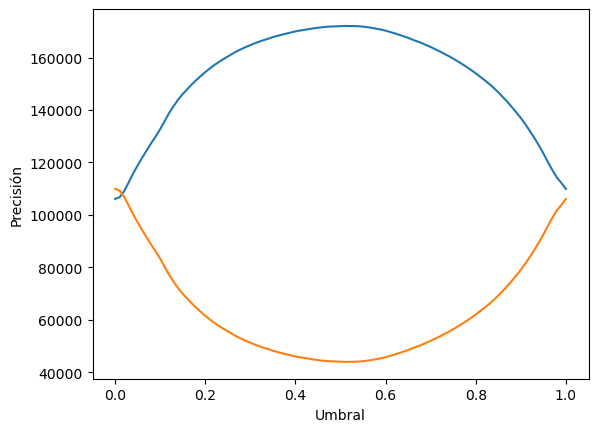

In [55]:
# Representamos los resultados para TP, FP, TN y FN
plt.plot(thresholds, TP, label = "TP")
plt.plot(thresholds, TN, label = "TN")
plt.plot(thresholds, FP, label = "FP")
plt.plot(thresholds, FN, label = "FN")
plt.legend()
plt.xlabel("Umbral")
plt.ylabel("Cantidad de sucesos predichos")
plt.show()

# Distribución del clasificador RF
plt.plot(thresholds, TN, label = "TN (gammas bien predichos)")
plt.plot(thresholds, TP, label = "TP (protones bien predichos)")
plt.legend()
plt.xlabel("Umbral")
plt.ylabel("Cantidad de sucesos predichos")
plt.show()

# Representamos la precisión
plt.plot(thresholds, accuracy)
plt.xlabel("Umbral")
plt.ylabel("Precisión")
plt.show()

# Representamos los aciertos y los fallos
plt.plot(thresholds, T, label = "TP+TN")
plt.plot(thresholds, F, label = "FP+FN")
plt.xlabel("Umbral")
plt.ylabel("Precisión")
plt.show()

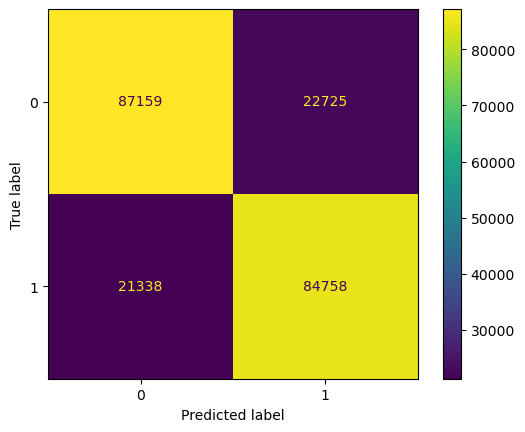

87159 21338 84758 22725


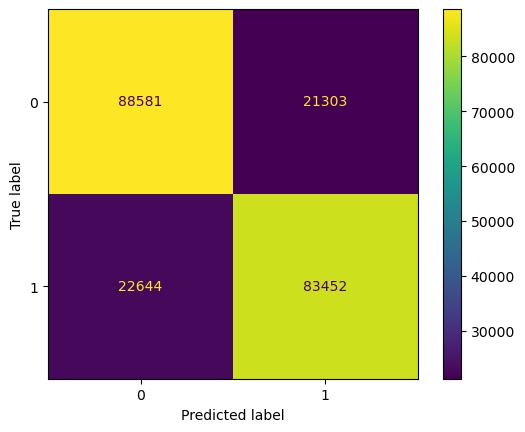

88581 22644 83452 21303


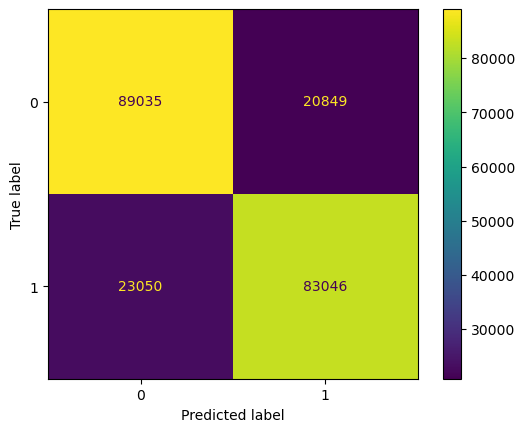

89035 23050 83046 20849


In [35]:
# Definimos el umbral que maximiza TP y TN y el que minimiza FP y FN:
thresholdmax = 0.49
thresholdmin = 0.505
thresholdaccur = 0.51

# Comprobamos los resultados
y_pred = (rfh.predict_proba(X_test)[:,1]>thresholdmax).astype("float")             # Hacemos que solamente nos devuelva los valores del threshold
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()
TN = cm[0][0]
FN = cm[1][0]
TP = cm[1][1]
FP = cm[0][1]
print(TN,FN,TP,FP)

y_pred = (rfh.predict_proba(X_test)[:,1]>thresholdmin).astype("float")             # Hacemos que solamente nos devuelva los valores del threshold
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()
TN = cm[0][0]
FN = cm[1][0]
TP = cm[1][1]
FP = cm[0][1]
print(TN,FN,TP,FP)

y_pred = (rfh.predict_proba(X_test)[:,1]>thresholdaccur).astype("float")             # Hacemos que solamente nos devuelva los valores del threshold
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()
TN = cm[0][0]
FN = cm[1][0]
TP = cm[1][1]
FP = cm[0][1]
print(TN,FN,TP,FP)

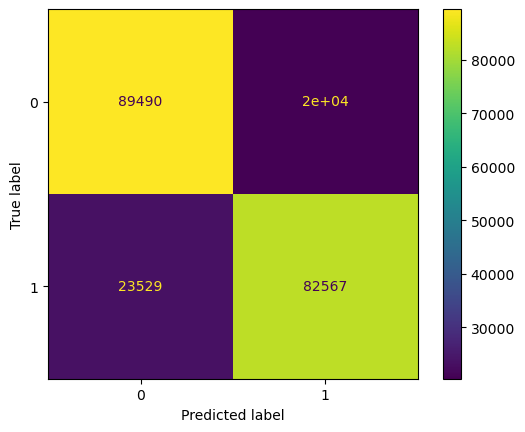

89490 23529 82567 20394


In [50]:
thresholdmax = 0.515

# Comprobamos los resultados
y_pred = (rfh.predict_proba(X_test)[:,1]>thresholdmax).astype("float")             # Hacemos que solamente nos devuelva los valores del threshold
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot()
plt.show()
TN = cm[0][0]
FN = cm[1][0]
TP = cm[1][1]
FP = cm[0][1]
print(TN,FN,TP,FP)

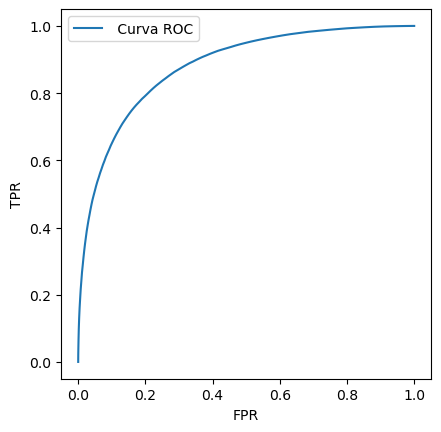

AUC para ROC de protones 0.8794183038488604
AUC para ROC de gammas 0.8794183038488603


In [34]:
from sklearn.metrics import RocCurveDisplay, auc

fig = plt.figure()
ax = fig.add_subplot()
plt.plot(FPRp, TPRp, label = " Curva ROC")
 
# square plot
ax.set_aspect('equal', adjustable='box')
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.savefig('ROC.png')
plt.show()

print('AUC para ROC de protones', auc(FPRp,TPRp))
print('AUC para ROC de gammas', auc(FPRg,TPRg))

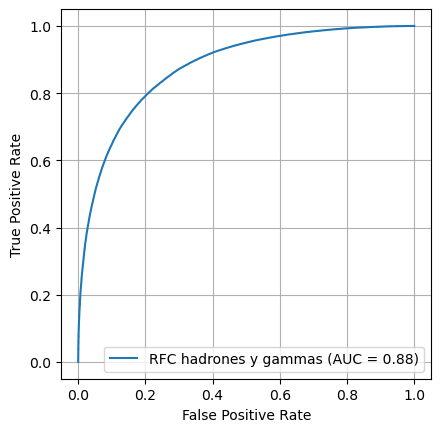

In [9]:
from sklearn.metrics import RocCurveDisplay
from sklearn import metrics

y_pred = (rfh.predict_proba(X_test))
fpr1, tpr1, thresholds1 = metrics.roc_curve(y_test, y_pred[:,1])
roc_auc1 = metrics.auc(fpr1, tpr1)

ax = plt.gca()
metrics.RocCurveDisplay(fpr=fpr1, tpr=tpr1, roc_auc=roc_auc1, estimator_name='RFC hadrones y gammas').plot(ax=ax)
ax.set_aspect('equal', adjustable='box')
plt.grid()
plt.savefig('ROC inicial.png')
plt.show()

In [78]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctapipe.io import TableLoader

# RandomForest
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Cargamos los datos
y_test = np.loadtxt("y_test_orden_regr")
y_pred = np.loadtxt("y_pred_orden_regre")

print(len(y_test))

162977


In [79]:
# Preparamos la representación
import mpl_scatter_density # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

# "Viridis-like" colormap with white background
white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#440053'),
    (0.2, '#404388'),
    (0.4, '#2a788e'),
    (0.6, '#21a784'),
    (0.8, '#78d151'),
    (1, '#fde624'),
], N=256)

def using_mpl_scatter_density(fig, x, y):
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, cmap=white_viridis)
    fig.colorbar(density, label='Número de puntos por píxel')

/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


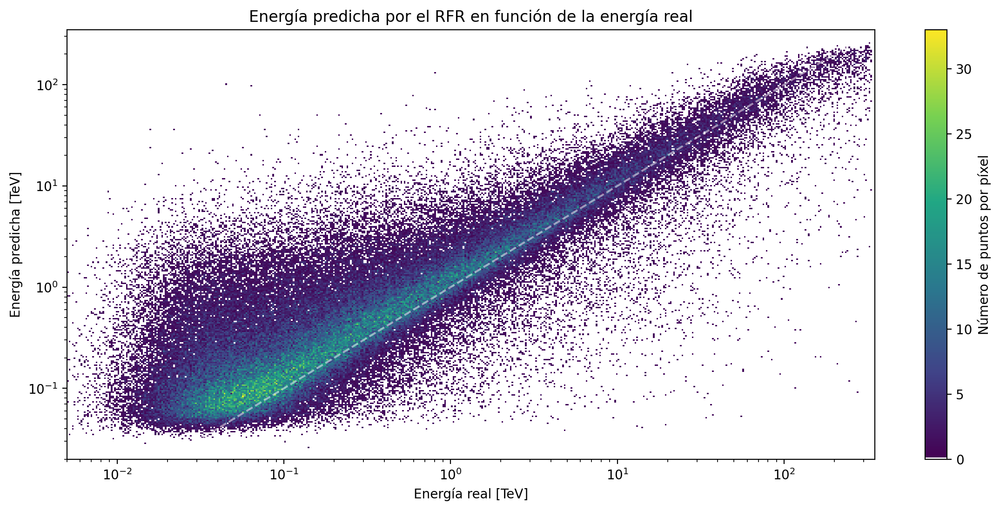

In [80]:
fig = plt.figure(figsize=(14, 6), dpi=200)
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real [TeV]')
plt.ylabel('Energía predicha [TeV]')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls='--')
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')
plt.ylim(0.02,350)
plt.xlim(0.005,350)
plt.savefig('Epred vs Ereal.png')
plt.show()

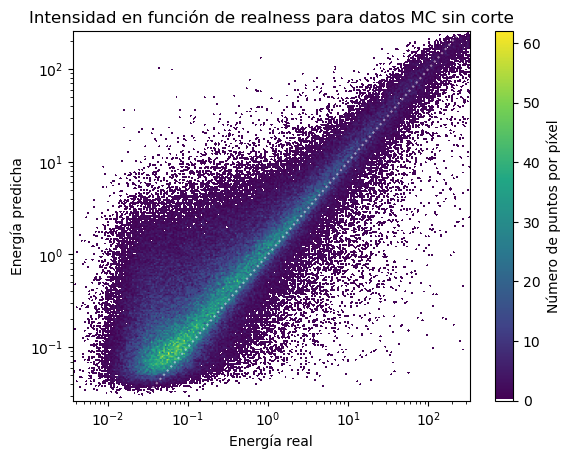

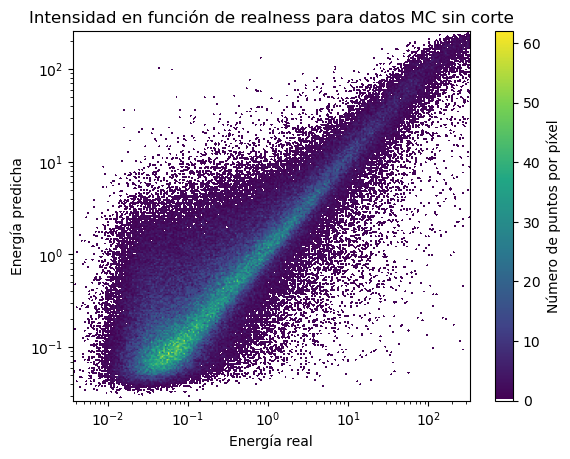

In [81]:
fig = plt.figure()
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls=':')
plt.yscale('log')
plt.xscale('log')
plt.title('Intensidad en función de realness para datos MC sin corte')
plt.show()
fig.savefig('Epred vs Etrue.png')

fig = plt.figure()
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.yscale('log')
plt.xscale('log')
plt.title('Intensidad en función de realness para datos MC sin corte')
plt.show()

In [82]:
# Sacamos los arrays de valores reales
test1 = y_test[0:16250]
test2 = y_test[16250:32500]
test3 = y_test[32500:48750]
test4 = y_test[48750:65000]
test5 = y_test[65000:81250]
test6 = y_test[81250:97500]
test7 = y_test[97500:113750]
test8 = y_test[113750:130000]
test9 = y_test[130000:146250]
test10 = y_test[146250:162976]

# Sacamos los arrays de valores predichos
pred1 = y_pred[0:16250]
pred2 = y_pred[16250:32500]
pred3 = y_pred[32500:48750]
pred4 = y_pred[48750:65000]
pred5 = y_pred[65000:81250]
pred6 = y_pred[81250:97500]
pred7 = y_pred[97500:113750]
pred8 = y_pred[113750:130000]
pred9 = y_pred[130000:146250]
pred10 = y_pred[146250:162976]

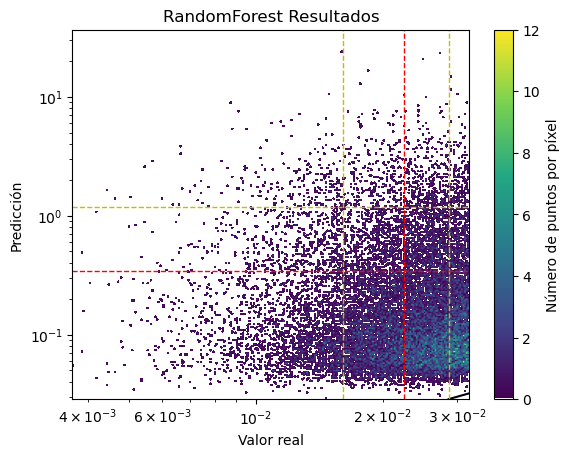

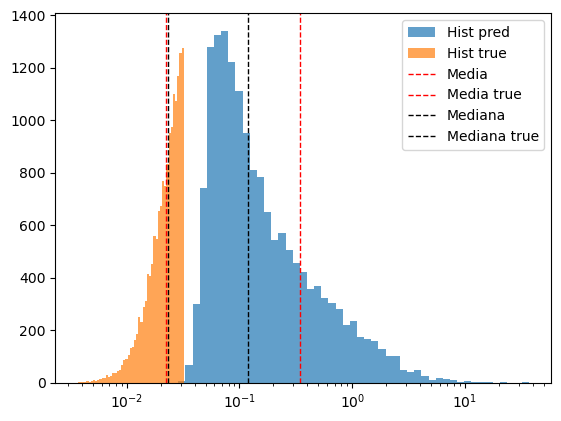

In [83]:
import scipy
from scipy import stats
media = []
errorx = []
errory = []
mediatrue = []
mediana = []
medianatrue = []

media1 = pred1.mean()
errory1 = pred1.std()
errorx1 = test1.std()
mediatrue1 = test1.mean()
mediana1 = np.median(pred1)
medianatrue1 = np.median(test1)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test1, pred1)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx1 + mediatrue1, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx1 + mediatrue1, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue1, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory1 + media1, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory1 + media1, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media1, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test1.min(), test1.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred1, np.geomspace(pred1.min(), pred1.max(), num=50), range=(pred1.min(), pred1.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test1, np.geomspace(test1.min(), test1.max(), num=50), range=(test1.min(), test1.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media1, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue1, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana1, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue1, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media1)
mediatrue.append(mediatrue1)
mediana.append(mediana1)
medianatrue.append(medianatrue1)
errory.append(errory1)
errorx.append(errorx1)

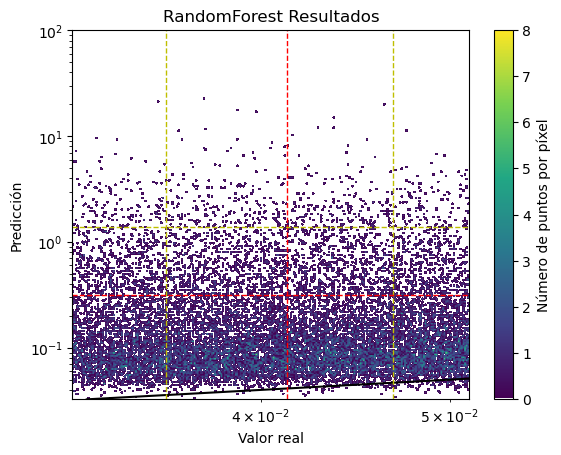

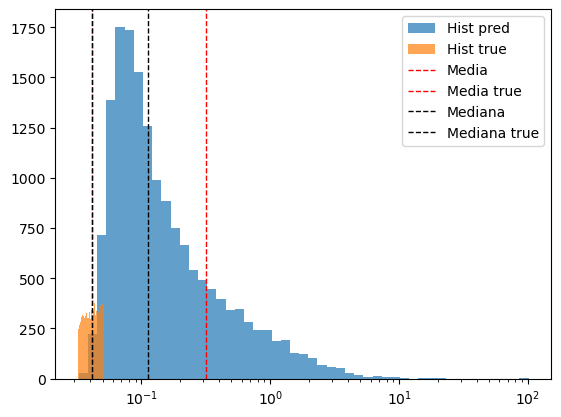

In [84]:
media2 = pred2.mean()
errory2 = pred2.std()
errorx2 = test2.std()
mediatrue2 = test2.mean()
mediana2 = np.median(pred2)
medianatrue2 = np.median(test2)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test2, pred2)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx2 + mediatrue2, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx2 + mediatrue2, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue2, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory2 + media2, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory2 + media2, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media2, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test2.min(), test2.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred2, np.geomspace(pred2.min(), pred2.max(), num=50), range=(pred2.min(), pred2.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test2, np.geomspace(test2.min(), test2.max(), num=50), range=(test2.min(), test2.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media2, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue2, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana2, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue2, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media2)
mediatrue.append(mediatrue2)
mediana.append(mediana2)
medianatrue.append(medianatrue2)
errory.append(errory2)
errorx.append(errorx2)

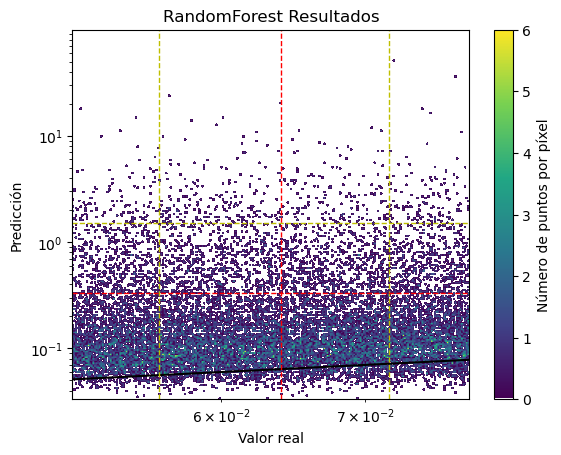

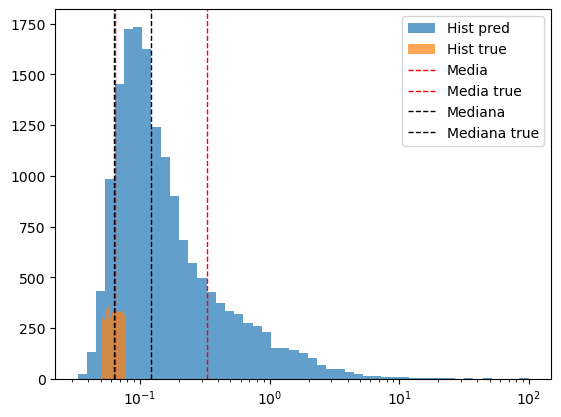

In [85]:
media3 = pred3.mean()
errory3 = pred3.std()
errorx3 = test3.std()
mediatrue3 = test3.mean()
mediana3 = np.median(pred3)
medianatrue3 = np.median(test3)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test3, pred3)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx3 + mediatrue3, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx3 + mediatrue3, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue3, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory3 + media3, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory3 + media3, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media3, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test3.min(), test3.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred3, np.geomspace(pred3.min(), pred3.max(), num=50), range=(pred3.min(), pred3.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test3, np.geomspace(test3.min(), test3.max(), num=50), range=(test3.min(), test3.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media3, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue3, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana3, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue3, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media3)
mediatrue.append(mediatrue3)
mediana.append(mediana3)
medianatrue.append(medianatrue3)
errory.append(errory3)
errorx.append(errorx3)

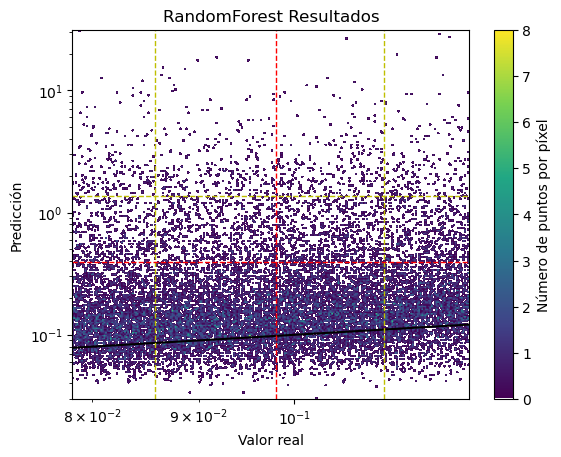

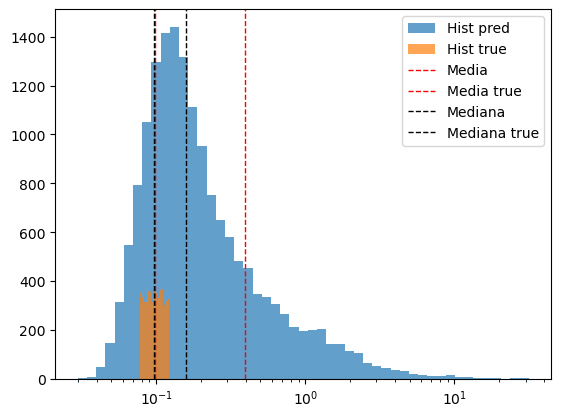

In [86]:
media4 = pred4.mean()
errory4 = pred4.std()
errorx4 = test4.std()
mediatrue4 = test4.mean()
mediana4 = np.median(pred4)
medianatrue4 = np.median(test4)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test4, pred4)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx4 + mediatrue4, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx4 + mediatrue4, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue4, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory4 + media4, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory4 + media4, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media4, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test4.min(), test4.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred4, np.geomspace(pred4.min(), pred4.max(), num=50), range=(pred4.min(), pred4.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test4, np.geomspace(test4.min(), test4.max(), num=50), range=(test4.min(), test4.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media4, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue4, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana4, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue4, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media4)
mediatrue.append(mediatrue4)
mediana.append(mediana4)
medianatrue.append(medianatrue4)
errory.append(errory4)
errorx.append(errorx4)

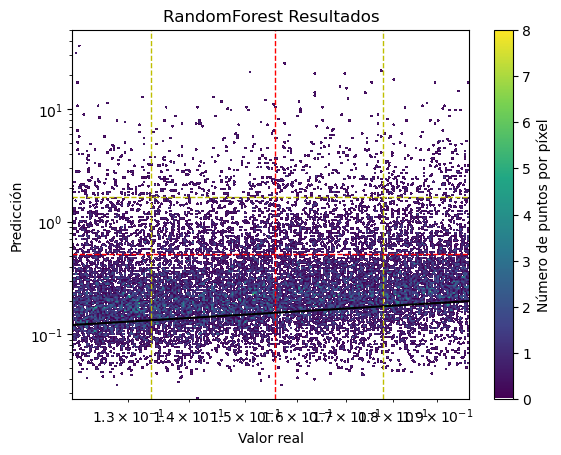

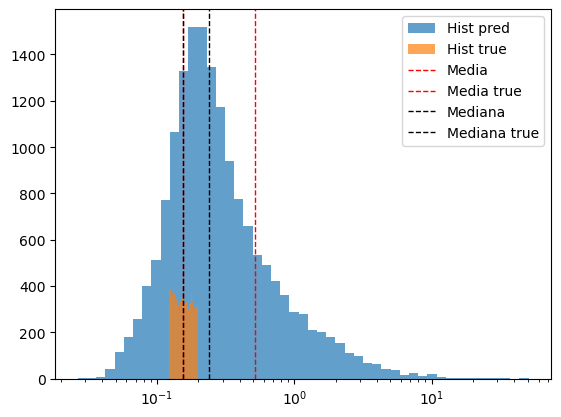

In [87]:
media5 = pred5.mean()
errory5 = pred5.std()
errorx5 = test5.std()
mediatrue5 = test5.mean()
mediana5 = np.median(pred5)
medianatrue5 = np.median(test5)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test5, pred5)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx5 + mediatrue5, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx5 + mediatrue5, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue5, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory5 + media5, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory5 + media5, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media5, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test5.min(), test5.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred5, np.geomspace(pred5.min(), pred5.max(), num=50), range=(pred5.min(), pred5.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test5, np.geomspace(test5.min(), test5.max(), num=50), range=(test5.min(), test5.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media5, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue5, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana5, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue5, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media5)
mediatrue.append(mediatrue5)
mediana.append(mediana5)
medianatrue.append(medianatrue5)
errory.append(errory5)
errorx.append(errorx5)

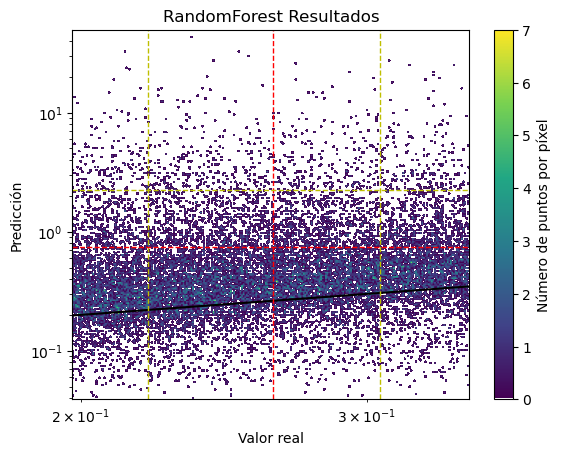

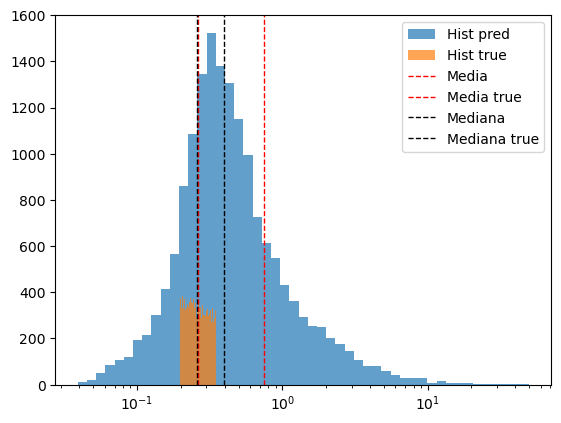

In [88]:
media6 = pred6.mean()
errory6 = pred6.std()
errorx6 = test6.std()
mediatrue6 = test6.mean()
mediana6 = np.median(pred6)
medianatrue6 = np.median(test6)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test6, pred6)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx6 + mediatrue6, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx6 + mediatrue6, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue6, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory6 + media6, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory6 + media6, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media6, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test6.min(), test6.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred6, np.geomspace(pred6.min(), pred6.max(), num=50), range=(pred6.min(), pred6.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test6, np.geomspace(test6.min(), test6.max(), num=50), range=(test6.min(), test6.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media6, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue6, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana6, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue6, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media6)
mediatrue.append(mediatrue6)
mediana.append(mediana6)
medianatrue.append(medianatrue6)
errory.append(errory6)
errorx.append(errorx6)

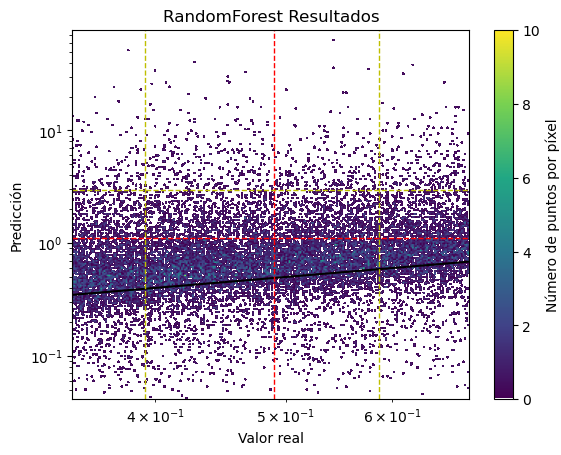

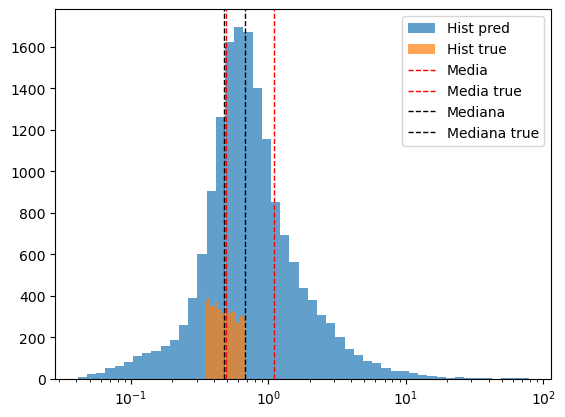

In [89]:
media7 = pred7.mean()
errory7 = pred7.std()
errorx7 = test7.std()
mediatrue7 = test7.mean()
mediana7 = np.median(pred7)
medianatrue7 = np.median(test7)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test7, pred7)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx7 + mediatrue7, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx7 + mediatrue7, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue7, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory7 + media7, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory7 + media7, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media7, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test7.min(), test7.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred7, np.geomspace(pred7.min(), pred7.max(), num=50), range=(pred7.min(), pred7.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test7, np.geomspace(test7.min(), test7.max(), num=50), range=(test7.min(), test7.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media7, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue7, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana7, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue7, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media7)
mediatrue.append(mediatrue7)
mediana.append(mediana7)
medianatrue.append(medianatrue7)
errory.append(errory7)
errorx.append(errorx7)

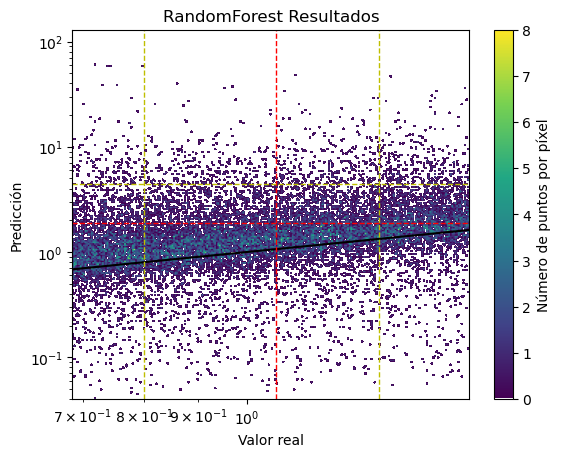

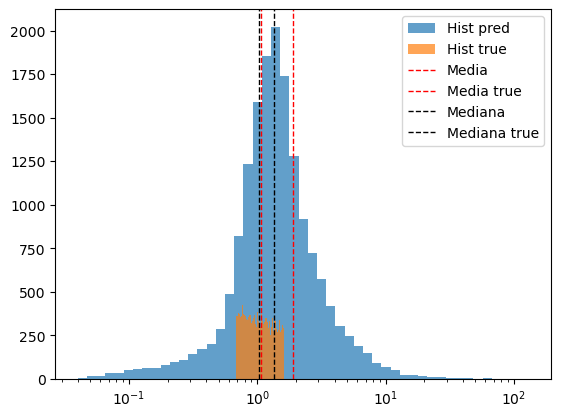

In [90]:
media8 = pred8.mean()
errory8 = pred8.std()
errorx8 = test8.std()
mediatrue8 = test8.mean()
mediana8 = np.median(pred8)
medianatrue8 = np.median(test8)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test8, pred8)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx8 + mediatrue8, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx8 + mediatrue8, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue8, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory8 + media8, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory8 + media8, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media8, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test8.min(), test8.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred8, np.geomspace(pred8.min(), pred8.max(), num=50), range=(pred8.min(), pred8.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test8, np.geomspace(test8.min(), test8.max(), num=50), range=(test8.min(), test8.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media8, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue8, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana8, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue8, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media8)
mediatrue.append(mediatrue8)
mediana.append(mediana8)
medianatrue.append(medianatrue8)
errory.append(errory8)
errorx.append(errorx8)

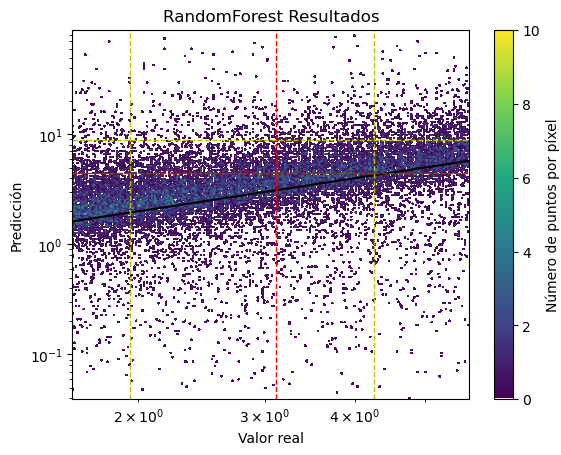

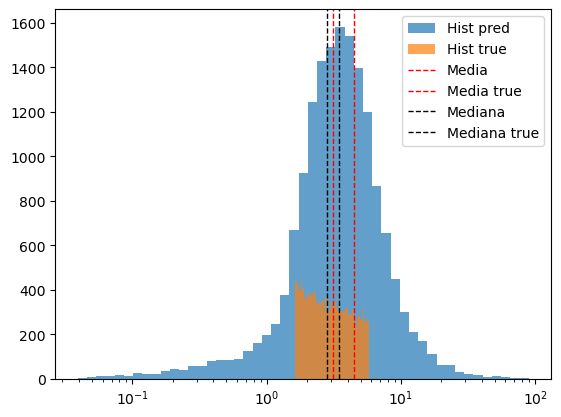

In [91]:
media9 = pred9.mean()
errory9 = pred9.std()
errorx9 = test9.std()
mediatrue9 = test9.mean()
mediana9 = np.median(pred9)
medianatrue9 = np.median(test9)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test9, pred9)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx9 + mediatrue9, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx9 + mediatrue9, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue9, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory9 + media9, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory9 + media9, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media9, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test9.min(), test9.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred9, np.geomspace(pred9.min(), pred9.max(), num=50), range=(pred9.min(), pred9.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test9, np.geomspace(test9.min(), test9.max(), num=50), range=(test9.min(), test9.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media9, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue9, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana9, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue9, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media9)
mediatrue.append(mediatrue9)
mediana.append(mediana9)
medianatrue.append(medianatrue9)
errory.append(errory9)
errorx.append(errorx9)

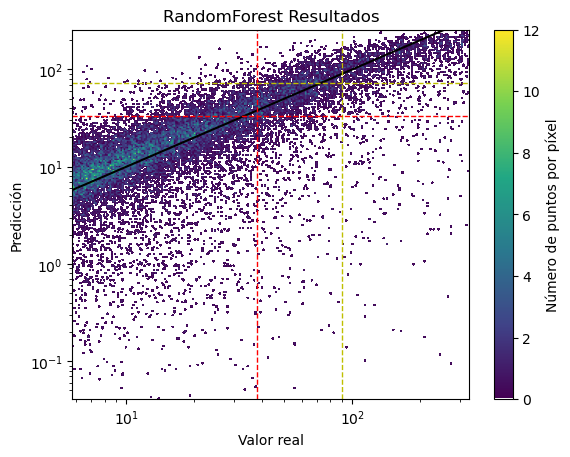

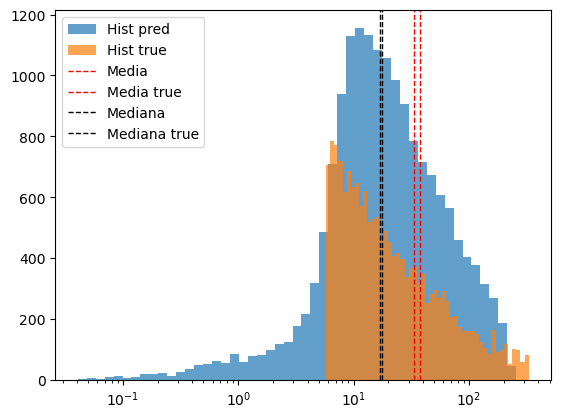

In [92]:
media10 = pred10.mean()
errory10 = pred10.std()
errorx10 = test10.std()
mediatrue10 = test10.mean()
mediana10 = np.median(pred10)
medianatrue10 = np.median(test10)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test10, pred10)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx10 + mediatrue10, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx10 + mediatrue10, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue10, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory10 + media10, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory10 + media10, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media10, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(test10.min(), test10.max())
plt.show()

# Representamos los dos histogramas
plt.hist(pred10, np.geomspace(pred10.min(), pred10.max(), num=50), range=(pred10.min(), pred10.max()), alpha = 0.7, label = 'Hist pred')
plt.hist(test10, np.geomspace(test10.min(), test10.max(), num=50), range=(test10.min(), test10.max()), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media10, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue10, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana10, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue10, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media10)
mediatrue.append(mediatrue10)
errory.append(errory10)
errorx.append(errorx10)
mediana.append(mediana10)
medianatrue.append(medianatrue10)

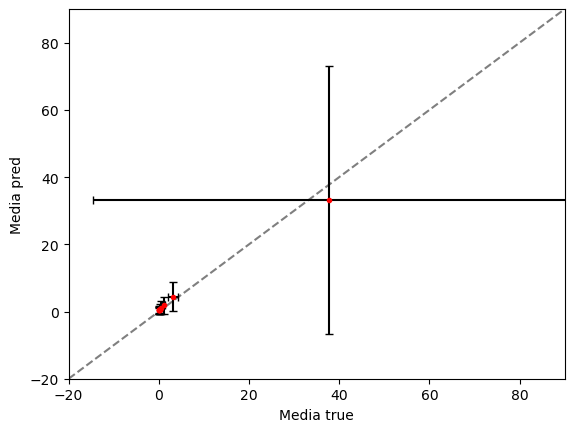

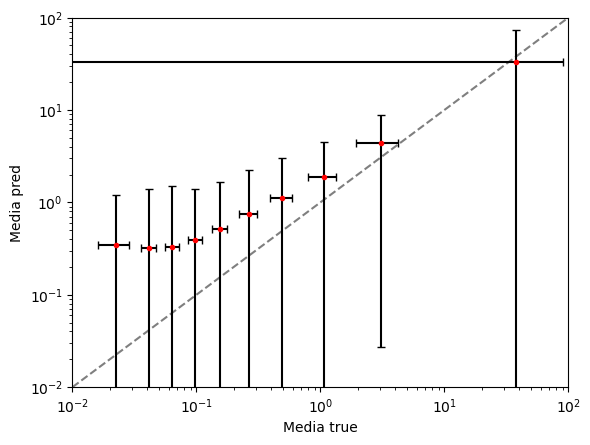

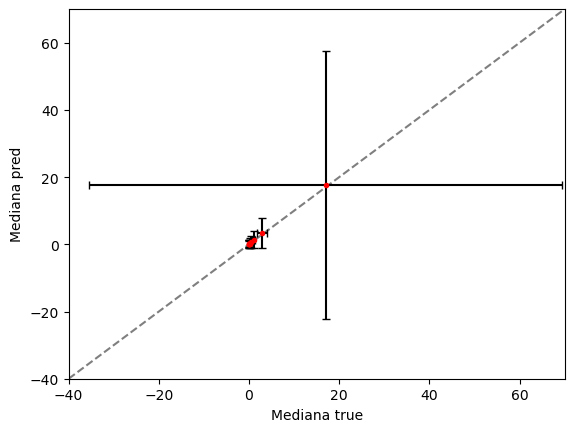

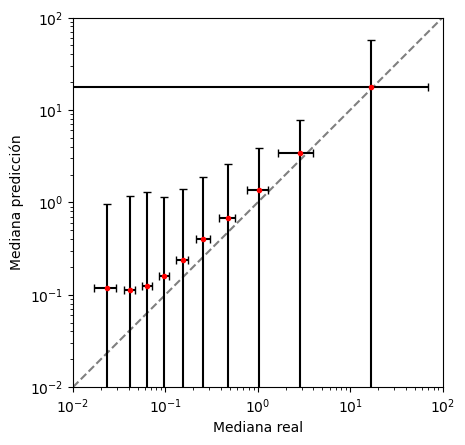

In [93]:
plt.errorbar(mediatrue, media, errory, errorx, capsize=3, fmt="r.", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xlabel('Media true')
plt.ylabel('Media pred')
plt.ylim(-20,90)
plt.xlim(-20,90)
plt.show()

plt.errorbar(mediatrue, media, errory, errorx, capsize=3, fmt="r.", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Media true')
plt.ylabel('Media pred')
plt.ylim(0.01,100)
plt.xlim(0.01,100)
plt.show()

plt.errorbar(medianatrue, mediana, errory, errorx, capsize=3, fmt="r.", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xlabel('Mediana true')
plt.ylabel('Mediana pred')
plt.ylim(-40,70)
plt.xlim(-40,70)
plt.show()

fig = plt.figure()
ax = fig.add_subplot()
ax.set_aspect('equal', adjustable='box')
plt.errorbar(medianatrue, mediana, errory, errorx, capsize=3, fmt=".", color = "r", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Mediana real')
plt.ylabel('Mediana predicción')
plt.ylim(0.01,100)
plt.xlim(0.01,100)
fig.savefig('Mediana.png')
plt.show()

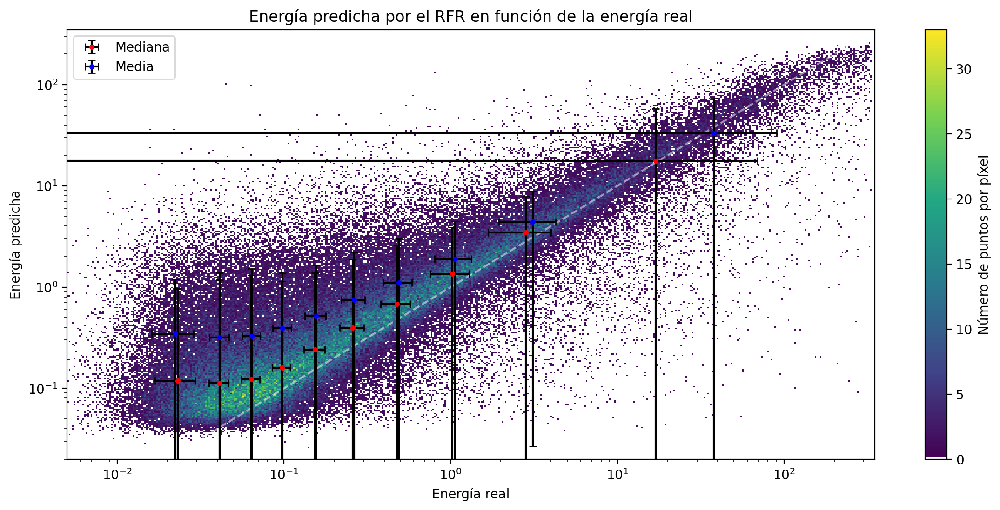

In [94]:
fig = plt.figure(figsize=(14, 6), dpi=200)
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls='--')
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')
plt.errorbar(medianatrue, mediana, errory, errorx, capsize=3, fmt=".", color = "r", ecolor = "black", label = 'Mediana')
plt.errorbar(mediatrue, media, errory, errorx, capsize=3, fmt=".", color = "b", ecolor = "black", label = 'Media')
plt.ylim(0.02,350)
plt.xlim(0.005,350)
plt.legend()
plt.show()

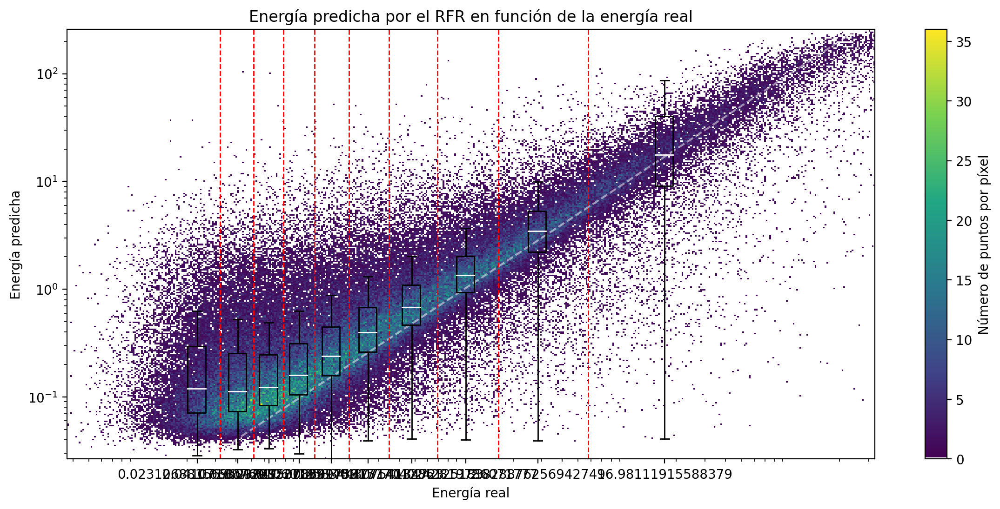

In [95]:
x = [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500]
xi = list(range(len(x)))

# Voy a hacer unos boxplots que creo que son útiles a la hora de mostrar estos resultados
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls='--')
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')
plt.boxplot([pred1, pred2, pred3, pred4, pred5, pred6, pred7, pred8, pred9, pred10],
            positions = [medianatrue1, medianatrue2, medianatrue3, medianatrue4, medianatrue5, medianatrue6, medianatrue7, medianatrue8, medianatrue9, medianatrue10],
            widths = [medianatrue1/4, medianatrue2/4, medianatrue3/4, medianatrue4/4, medianatrue5/4, medianatrue6/4, medianatrue7/4, medianatrue8/4, medianatrue9/4, medianatrue10/4],
            sym='',
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='white'))
plt.axvline(test2[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test3[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test4[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test5[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test6[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test7[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test8[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test9[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test10[0], color='r', linestyle='dashed', linewidth=1)
plt.show()

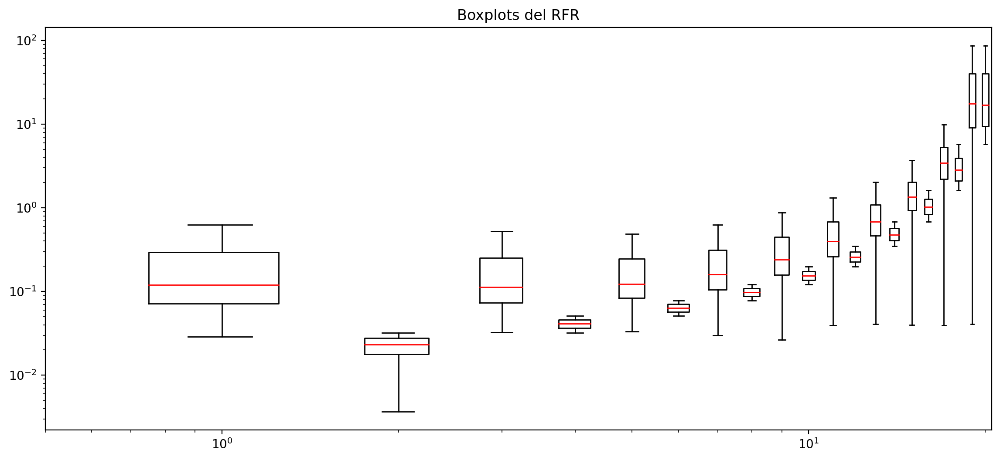

In [96]:
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
plt.boxplot([pred1, test1, pred2, test2, pred3, test3, pred4, test4, pred5, test5, 
            pred6, test6, pred7, test7, pred8, test8, pred9, test9, pred10, test10],
            #positions = [mediana1, medianatrue1, mediana2, medianatrue2, mediana3, medianatrue3, medianatrue4, medianatrue4, mediana5, medianatrue5,
            #             mediana6, medianatrue6, mediana7, medianatrue7, mediana8, medianatrue8, mediana9, medianatrue9, mediana10, medianatrue10],
            #widths = [mediana1/4, medianatrue1/4, mediana2/4, medianatrue2/4, mediana3/4, medianatrue3/4, mediana4/4, medianatrue4/4, mediana5/4, medianatrue5/4, 
            #          mediana6/4, medianatrue6/4, mediana7/4, medianatrue7/4, mediana8/4, medianatrue8/4, mediana9/4, medianatrue9/4, mediana10/4, medianatrue10/4,],
            sym='',
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))

# Personalizar la figura
plt.yscale('log')
plt.xscale('log')
plt.title('Boxplots del RFR')
# Mostrar la figura
plt.yscale('log')
plt.show()

In [97]:
limites = np.logspace(-2.4, 2.6, num=11, endpoint=True, base=10.0, dtype=None, axis=0)
print(limites)

[3.98107171e-03 1.25892541e-02 3.98107171e-02 1.25892541e-01
 3.98107171e-01 1.25892541e+00 3.98107171e+00 1.25892541e+01
 3.98107171e+01 1.25892541e+02 3.98107171e+02]


In [98]:
pred1 = []
pred2 = []
pred3 = []
pred4 = []
pred5 = []
pred6 = []
pred7 = []
pred8 = []
pred9 = []
pred10 = []
test1 = []
test2 = []
test3 = []
test4 = []
test5 = []
test6 = []
test7 = []
test8 = []
test9 = []
test10 = []

In [99]:
for i in range(len(y_test)):
    if y_test[i] <= limites[1] and y_test[i] >= limites[0]:
        pred1.append(y_pred[i])
        test1.append(y_test[i])
    elif y_test[i] <= limites[2] and y_test[i] >= limites[1]:
        pred2.append(y_pred[i])
        test2.append(y_test[i])
    elif y_test[i] <= limites[3] and y_test[i] >= limites[2]:
        pred3.append(y_pred[i])
        test3.append(y_test[i])
    elif y_test[i] <= limites[4] and y_test[i] >= limites[3]:
        pred4.append(y_pred[i])
        test4.append(y_test[i])
    elif y_test[i] <= limites[5] and y_test[i] >= limites[4]:
        pred5.append(y_pred[i])
        test5.append(y_test[i])
    elif y_test[i] <= limites[6] and y_test[i] >= limites[5]:
        pred6.append(y_pred[i])
        test6.append(y_test[i])
    elif y_test[i] <= limites[7] and y_test[i] >= limites[6]:
        pred7.append(y_pred[i])
        test7.append(y_test[i])
    elif y_test[i] <= limites[8] and y_test[i] >= limites[7]:
        pred8.append(y_pred[i])
        test8.append(y_test[i])
    elif y_test[i] <= limites[9] and y_test[i] >= limites[8]:
        pred9.append(y_pred[i])
        test9.append(y_test[i])
    elif y_test[i] <= limites[10] and y_test[i] >= limites[9]:
        pred10.append(y_pred[i])
        test10.append(y_test[i])

/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


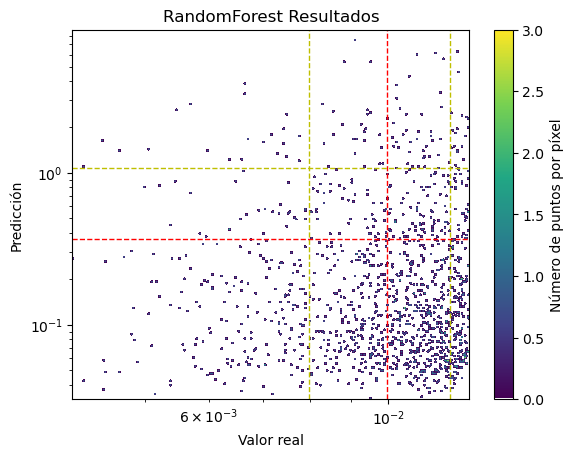

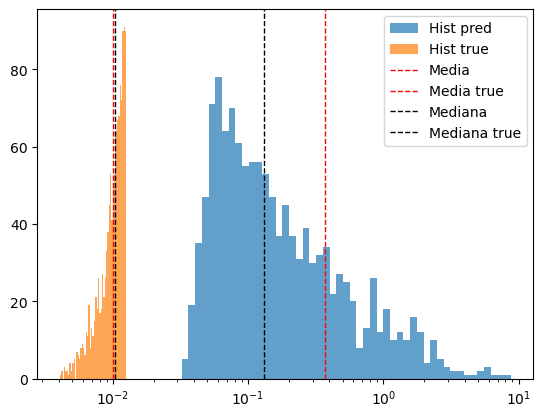

In [100]:
import scipy
from scipy import stats
media = []
errorx = []
errory = []
mediatrue = []
mediana = []
medianatrue = []

media1 = np.mean(pred1)
errory1 = np.std(pred1)
errorx1 = np.std(test1)
mediatrue1 = np.mean(test1)
mediana1 = np.median(pred1)
medianatrue1 = np.median(test1)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test1, pred1)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx1 + mediatrue1, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx1 + mediatrue1, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue1, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory1 + media1, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory1 + media1, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media1, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test1), np.max(test1))
plt.show()

# Representamos los dos histogramas
plt.hist(pred1, np.geomspace(np.min(pred1), np.max(pred1), num=50), range=(np.min(pred1), np.max(pred1)), alpha = 0.7, label = 'Hist pred')
plt.hist(test1, np.geomspace(np.min(test1), np.max(test1), num=50), range=(np.min(test1), np.max(test1)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media1, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue1, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana1, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue1, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media1)
mediatrue.append(mediatrue1)
mediana.append(mediana1)
medianatrue.append(medianatrue1)
errory.append(errory1)
errorx.append(errorx1)

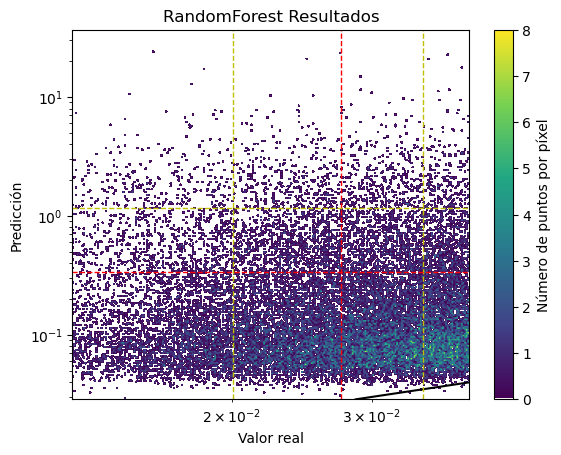

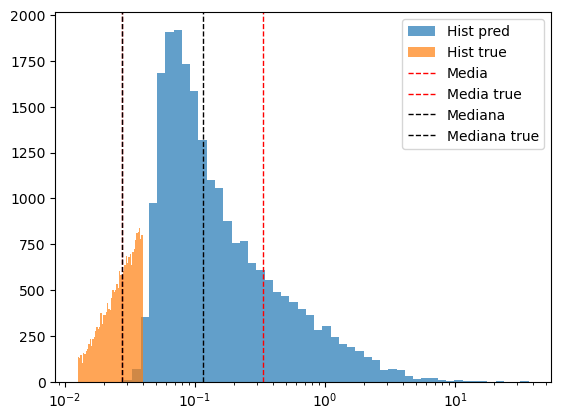

In [101]:
media2 = np.mean(pred2)
errory2 = np.std(pred2)
errorx2 = np.std(test2)
mediatrue2 = np.mean(test2)
mediana2 = np.median(pred2)
medianatrue2 = np.median(test2)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test2, pred2)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx2 + mediatrue2, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx2 + mediatrue2, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue2, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory2 + media2, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory2 + media2, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media2, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test2), np.max(test2))
plt.show()

# Representamos los dos histogramas
plt.hist(pred2, np.geomspace(np.min(pred2), np.max(pred2), num=50), range=(np.min(pred2), np.max(pred2)), alpha = 0.7, label = 'Hist pred')
plt.hist(test2, np.geomspace(np.min(test2), np.max(test2), num=50), range=(np.min(test2), np.max(test2)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media2, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue2, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana2, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue2, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media2)
mediatrue.append(mediatrue2)
mediana.append(mediana2)
medianatrue.append(medianatrue2)
errory.append(errory2)
errorx.append(errorx2)

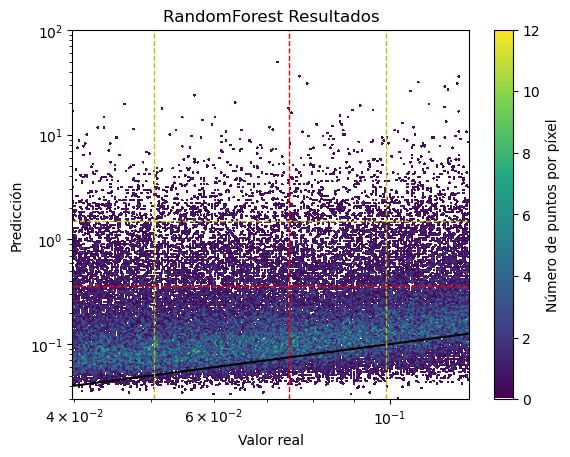

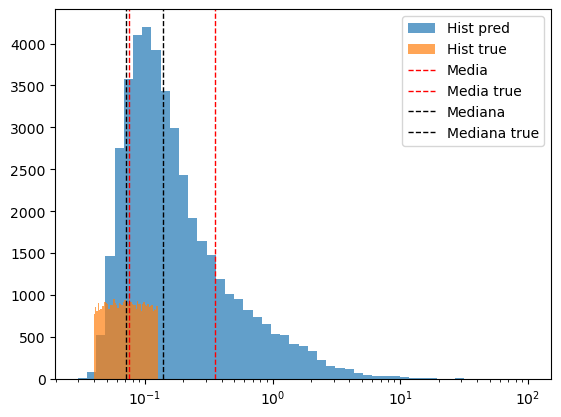

In [102]:
media3 = np.mean(pred3)
errory3 = np.std(pred3)
errorx3 = np.std(test3)
mediatrue3 = np.mean(test3)
mediana3 = np.median(pred3)
medianatrue3 = np.median(test3)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test3, pred3)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx3 + mediatrue3, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx3 + mediatrue3, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue3, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory3 + media3, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory3 + media3, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media3, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test3), np.max(test3))
plt.show()

# Representamos los dos histogramas
plt.hist(pred3, np.geomspace(np.min(pred3), np.max(pred3), num=50), range=(np.min(pred3), np.max(pred3)), alpha = 0.7, label = 'Hist pred')
plt.hist(test3, np.geomspace(np.min(test3), np.max(test3), num=50), range=(np.min(test3), np.max(test3)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media3, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue3, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana3, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue3, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media3)
mediatrue.append(mediatrue3)
mediana.append(mediana3)
medianatrue.append(medianatrue3)
errory.append(errory3)
errorx.append(errorx3)

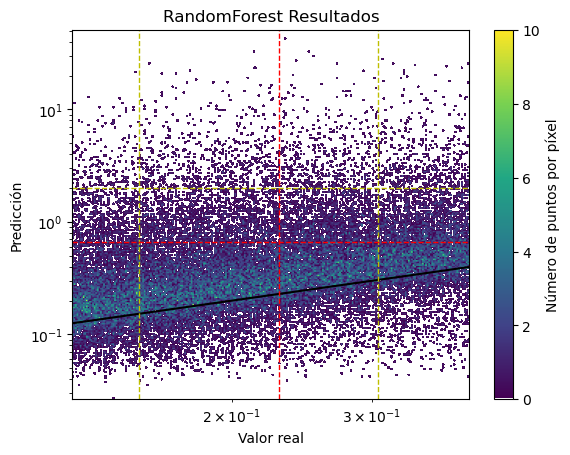

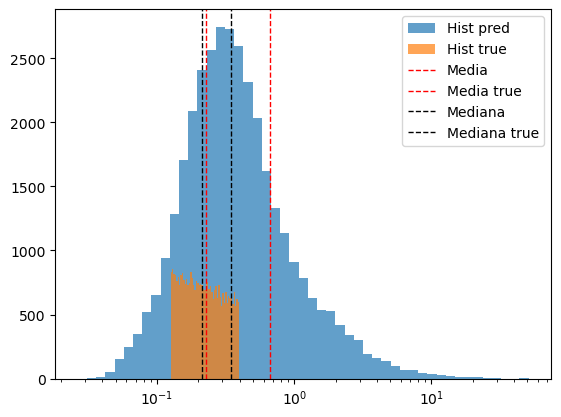

In [103]:
media4 = np.mean(pred4)
errory4 = np.std(pred4)
errorx4 = np.std(test4)
mediatrue4 = np.mean(test4)
mediana4 = np.median(pred4)
medianatrue4 = np.median(test4)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test4, pred4)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx4 + mediatrue4, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx4 + mediatrue4, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue4, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory4 + media4, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory4 + media4, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media4, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test4), np.max(test4))
plt.show()

# Representamos los dos histogramas
plt.hist(pred4, np.geomspace(np.min(pred4), np.max(pred4), num=50), range=(np.min(pred4), np.max(pred4)), alpha = 0.7, label = 'Hist pred')
plt.hist(test4, np.geomspace(np.min(test4), np.max(test4), num=50), range=(np.min(test4), np.max(test4)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media4, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue4, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana4, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue4, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media4)
mediatrue.append(mediatrue4)
mediana.append(mediana4)
medianatrue.append(medianatrue4)
errory.append(errory4)
errorx.append(errorx4)

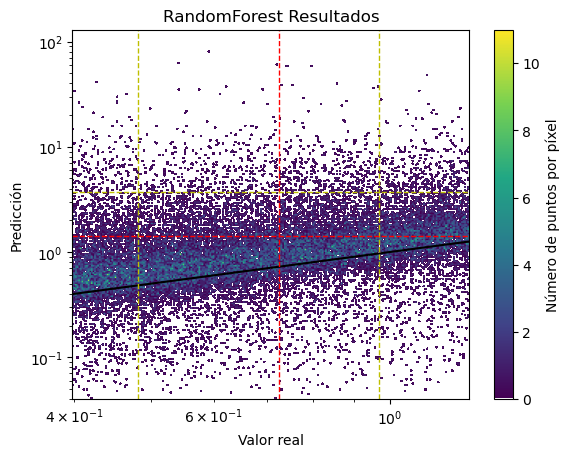

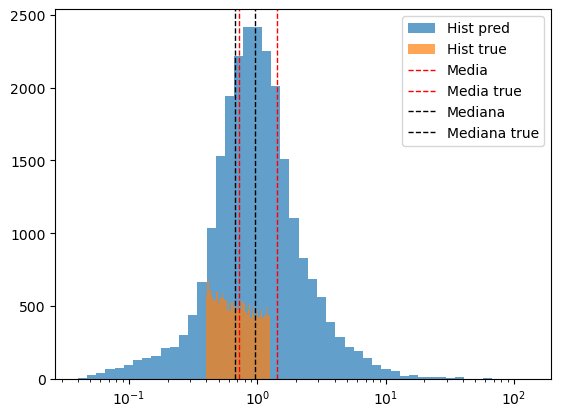

In [104]:
media5 = np.mean(pred5)
errory5 = np.std(pred5)
errorx5 = np.std(test5)
mediatrue5 = np.mean(test5)
mediana5 = np.median(pred5)
medianatrue5 = np.median(test5)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test5, pred5)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx5 + mediatrue5, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx5 + mediatrue5, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue5, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory5 + media5, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory5 + media5, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media5, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test5), np.max(test5))
plt.show()

# Representamos los dos histogramas
plt.hist(pred5, np.geomspace(np.min(pred5), np.max(pred5), num=50), range=(np.min(pred5), np.max(pred5)), alpha = 0.7, label = 'Hist pred')
plt.hist(test5, np.geomspace(np.min(test5), np.max(test5), num=50), range=(np.min(test5), np.max(test5)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media5, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue5, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana5, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue5, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media5)
mediatrue.append(mediatrue5)
mediana.append(mediana5)
medianatrue.append(medianatrue5)
errory.append(errory5)
errorx.append(errorx5)

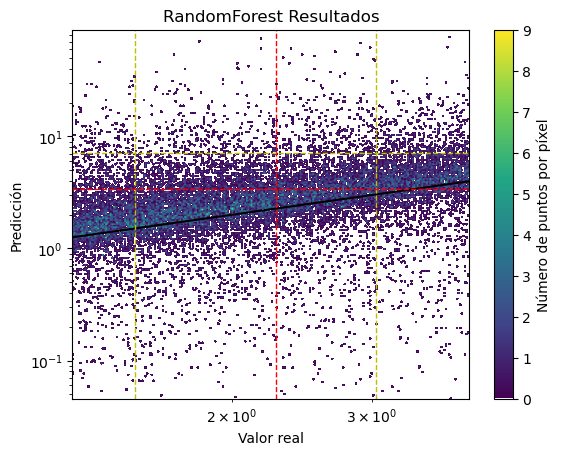

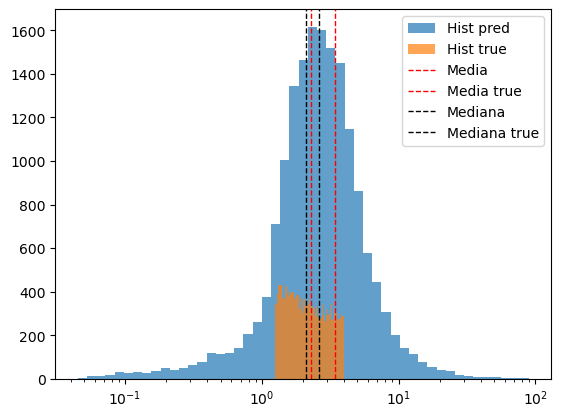

In [105]:
media6 = np.mean(pred6)
errory6 = np.std(pred6)
errorx6 = np.std(test6)
mediatrue6 = np.mean(test6)
mediana6 = np.median(pred6)
medianatrue6 = np.median(test6)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test6, pred6)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx6 + mediatrue6, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx6 + mediatrue6, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue6, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory6 + media6, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory6 + media6, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media6, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test6), np.max(test6))
plt.show()

# Representamos los dos histogramas
plt.hist(pred6, np.geomspace(np.min(pred6), np.max(pred6), num=50), range=(np.min(pred6), np.max(pred6)), alpha = 0.7, label = 'Hist pred')
plt.hist(test6, np.geomspace(np.min(test6), np.max(test6), num=50), range=(np.min(test6), np.max(test6)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media6, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue6, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana6, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue6, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media6)
mediatrue.append(mediatrue6)
mediana.append(mediana6)
medianatrue.append(medianatrue6)
errory.append(errory6)
errorx.append(errorx6)

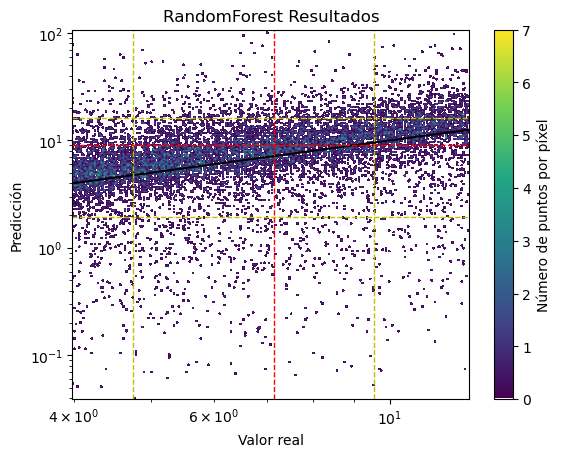

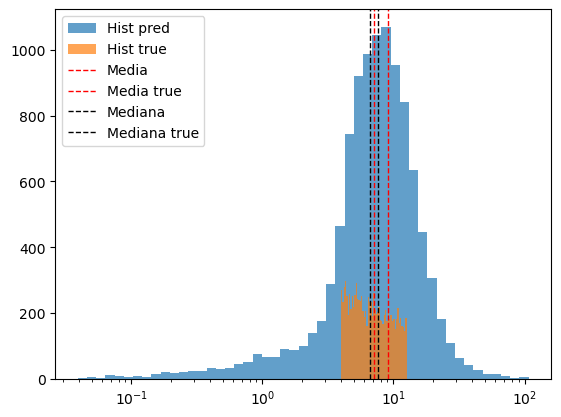

In [106]:
media7 = np.mean(pred7)
errory7 = np.std(pred7)
errorx7 = np.std(test7)
mediatrue7 = np.mean(test7)
mediana7 = np.median(pred7)
medianatrue7 = np.median(test7)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test7, pred7)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx7 + mediatrue7, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx7 + mediatrue7, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue7, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory7 + media7, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory7 + media7, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media7, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test7), np.max(test7))
plt.show()

# Representamos los dos histogramas
plt.hist(pred7, np.geomspace(np.min(pred7), np.max(pred7), num=50), range=(np.min(pred7), np.max(pred7)), alpha = 0.7, label = 'Hist pred')
plt.hist(test7, np.geomspace(np.min(test7), np.max(test7), num=50), range=(np.min(test7), np.max(test7)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media7, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue7, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana7, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue7, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media7)
mediatrue.append(mediatrue7)
mediana.append(mediana7)
medianatrue.append(medianatrue7)
errory.append(errory7)
errorx.append(errorx7)

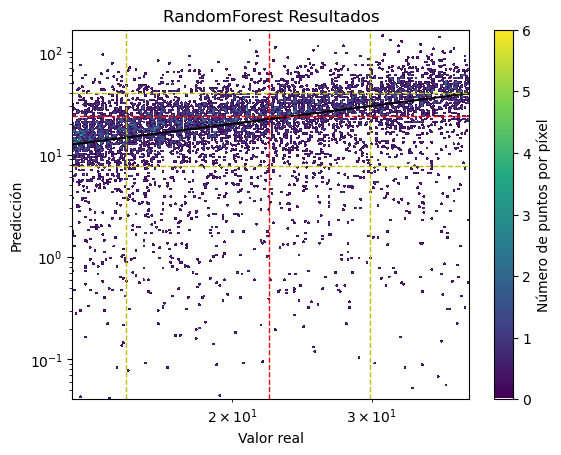

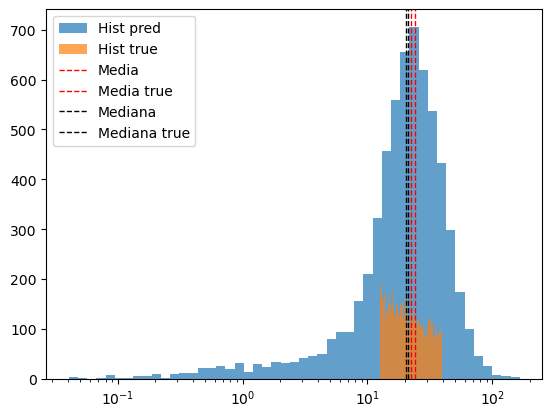

In [107]:
media8 = np.mean(pred8)
errory8 = np.std(pred8)
errorx8 = np.std(test8)
mediatrue8 = np.mean(test8)
mediana8 = np.median(pred8)
medianatrue8 = np.median(test8)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test8, pred8)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx8 + mediatrue8, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx8 + mediatrue8, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue8, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory8 + media8, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory8 + media8, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media8, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test8), np.max(test8))
plt.show()

# Representamos los dos histogramas
plt.hist(pred8, np.geomspace(np.min(pred8), np.max(pred8), num=50), range=(np.min(pred8), np.max(pred8)), alpha = 0.7, label = 'Hist pred')
plt.hist(test8, np.geomspace(np.min(test8), np.max(test8), num=50), range=(np.min(test8), np.max(test8)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media8, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue8, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana8, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue8, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media8)
mediatrue.append(mediatrue8)
mediana.append(mediana8)
medianatrue.append(medianatrue8)
errory.append(errory8)
errorx.append(errorx8)

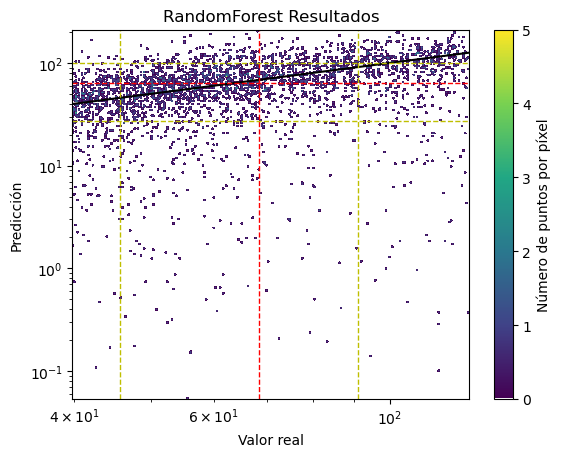

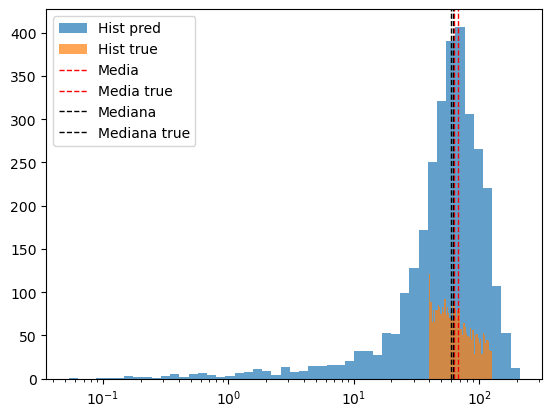

In [108]:
media9 = np.mean(pred9)
errory9 = np.std(pred9)
errorx9 = np.std(test9)
mediatrue9 = np.mean(test9)
mediana9 = np.median(pred9)
medianatrue9 = np.median(test9)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test9, pred9)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx9 + mediatrue9, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx9 + mediatrue9, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue9, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory9 + media9, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory9 + media9, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media9, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test9), np.max(test9))
plt.show()

# Representamos los dos histogramas
plt.hist(pred9, np.geomspace(np.min(pred9), np.max(pred9), num=50), range=(np.min(pred9), np.max(pred9)), alpha = 0.7, label = 'Hist pred')
plt.hist(test9, np.geomspace(np.min(test9), np.max(test9), num=50), range=(np.min(test9), np.max(test9)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media9, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue9, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana9, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue9, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media9)
mediatrue.append(mediatrue9)
mediana.append(mediana9)
medianatrue.append(medianatrue9)
errory.append(errory9)
errorx.append(errorx9)

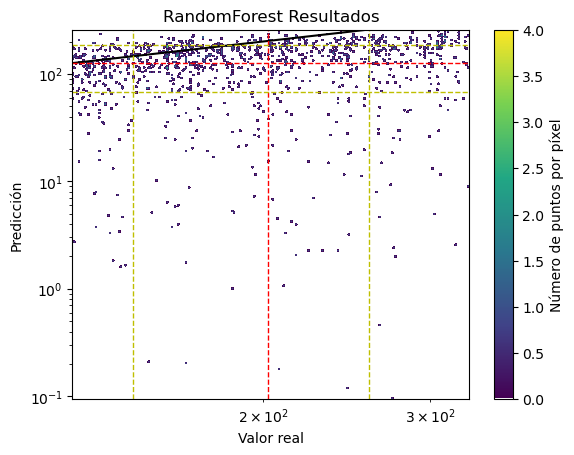

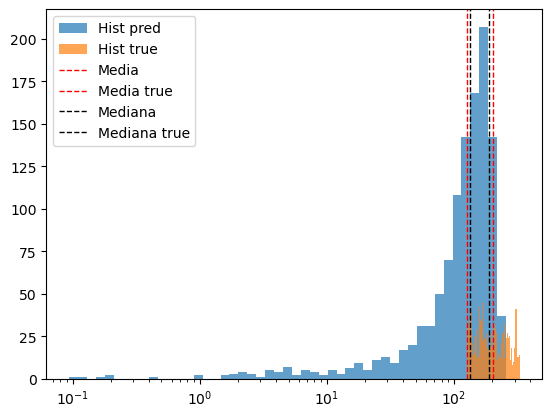

In [109]:
media10 = np.mean(pred10)
errory10 = np.std(pred10)
errorx10 = np.std(test10)
mediatrue10 = np.mean(test10)
mediana10 = np.median(pred10)
medianatrue10 = np.median(test10)

# Representamos la reconstrucción frente a los valores reales
fig = plt.figure()
using_mpl_scatter_density(fig, test10, pred10)
plt.axline((1, 1), slope=1, c="k")
plt.title("RandomForest Resultados")
plt.xlabel('Valor real')
plt.ylabel('Predicción')
plt.yscale('log')
plt.xscale('log')
plt.axvline(-errorx10 + mediatrue10, color='y', linestyle='dashed', linewidth=1, label='Std true')
plt.axvline(errorx10 + mediatrue10, color='y', linestyle='dashed', linewidth=1)
plt.axvline(mediatrue10, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axhline(-errory10 + media10, color='y', linestyle='dashed', linewidth=1, label='Std pred')
plt.axhline(errory10 + media10, color='y', linestyle='dashed', linewidth=1)
plt.axhline(media10, color='r', linestyle='dashed', linewidth=1, label='Media pred')
plt.xlim(np.min(test10), np.max(test10))
plt.show()

# Representamos los dos histogramas
plt.hist(pred10, np.geomspace(np.min(pred10), np.max(pred10), num=50), range=(np.min(pred10), np.max(pred10)), alpha = 0.7, label = 'Hist pred')
plt.hist(test10, np.geomspace(np.min(test10), np.max(test10), num=50), range=(np.min(test10), np.max(test10)), alpha = 0.7, label = 'Hist true')
plt.xscale('log')
plt.axvline(media10, color='r', linestyle='dashed', linewidth=1, label='Media')
plt.axvline(mediatrue10, color='r', linestyle='dashed', linewidth=1, label='Media true')
plt.axvline(mediana10, color='k', linestyle='dashed', linewidth=1, label='Mediana')
plt.axvline(medianatrue10, color='k', linestyle='dashed', linewidth=1, label='Mediana true')
plt.xscale('log')
plt.legend()
plt.show()

# Añadimos la media y los errores para el plot final
media.append(media10)
mediatrue.append(mediatrue10)
errory.append(errory10)
errorx.append(errorx10)
mediana.append(mediana10)
medianatrue.append(medianatrue10)

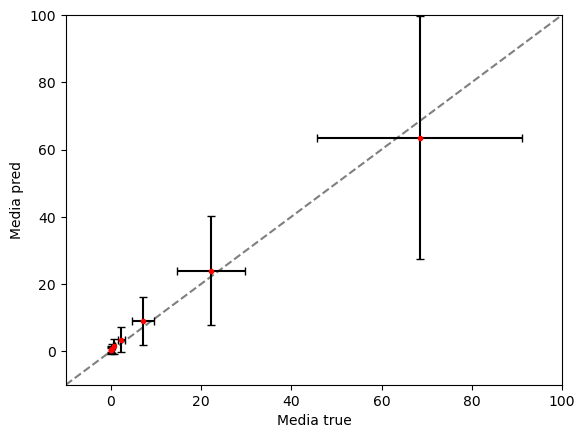

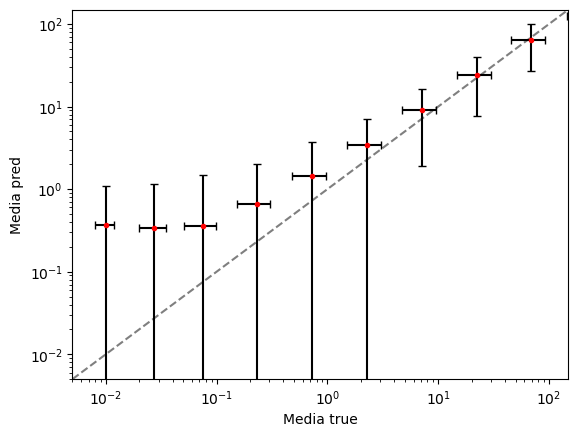

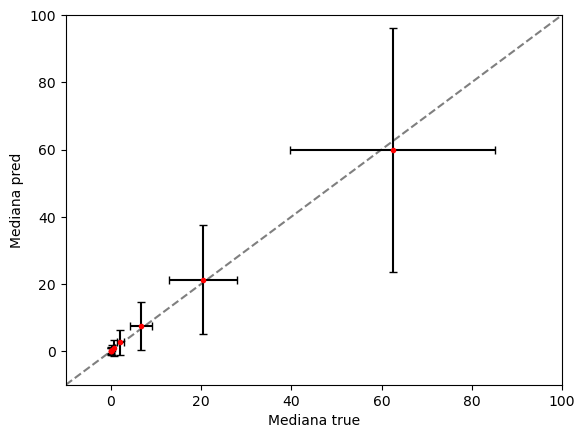

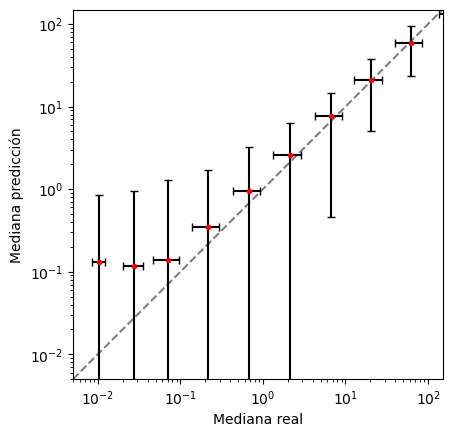

In [110]:
plt.errorbar(mediatrue, media, errory, errorx, capsize=3, fmt="r.", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xlabel('Media true')
plt.ylabel('Media pred')
plt.ylim(-10,100)
plt.xlim(-10,100)
plt.show()

plt.errorbar(mediatrue, media, errory, errorx, capsize=3, fmt="r.", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Media true')
plt.ylabel('Media pred')
plt.ylim(0.005,150)
plt.xlim(0.005,150)
plt.show()

plt.errorbar(medianatrue, mediana, errory, errorx, capsize=3, fmt="r.", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xlabel('Mediana true')
plt.ylabel('Mediana pred')
plt.ylim(-10,100)
plt.xlim(-10,100)
plt.show()

fig = plt.figure()
ax = fig.add_subplot()
ax.set_aspect('equal', adjustable='box')
plt.errorbar(medianatrue, mediana, errory, errorx, capsize=3, fmt=".", color = "r", ecolor = "black")
plt.axline((1, 1), slope=1, c="k", alpha = 0.5, linestyle='dashed')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Mediana real')
plt.ylabel('Mediana predicción')
plt.ylim(0.005,150)
plt.xlim(0.005,150)
fig.savefig('Mediana.png')
plt.show()

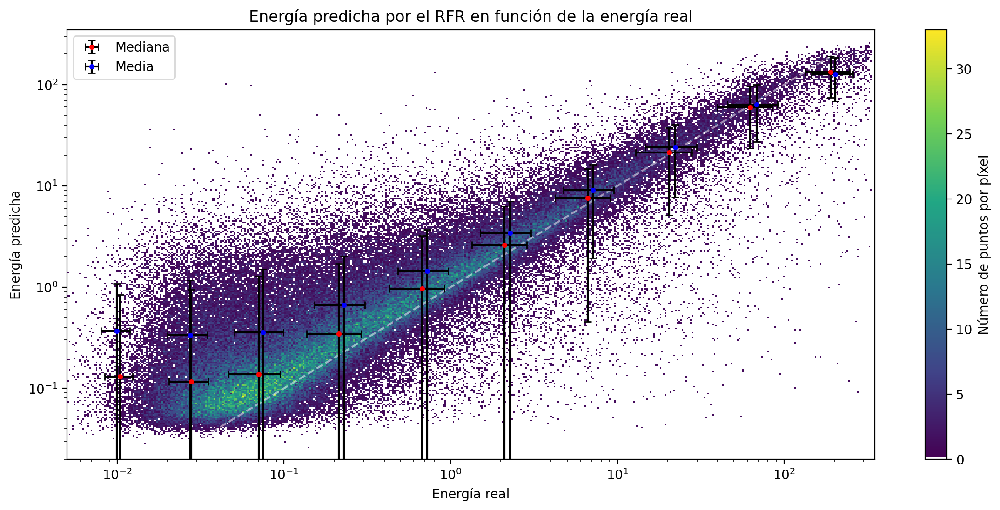

In [111]:
fig = plt.figure(figsize=(14, 6), dpi=200)
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls='--')
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')
plt.errorbar(medianatrue, mediana, errory, errorx, capsize=3, fmt=".", color = "r", ecolor = "black", label = 'Mediana')
plt.errorbar(mediatrue, media, errory, errorx, capsize=3, fmt=".", color = "b", ecolor = "black", label = 'Media')
plt.ylim(0.02,350)
plt.xlim(0.005,350)
plt.legend()
plt.show()

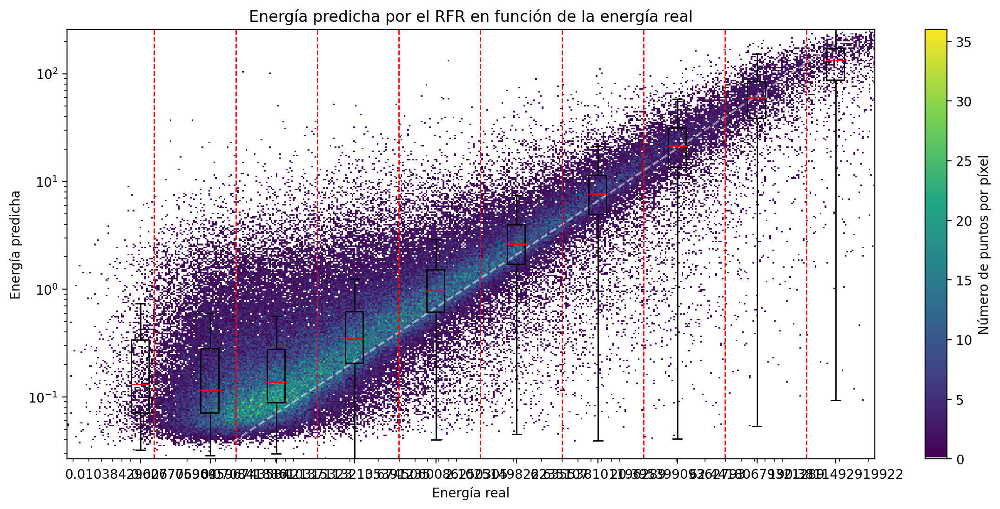

In [112]:
x = [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500]
xi = list(range(len(x)))

# Voy a hacer unos boxplots que creo que son útiles a la hora de mostrar estos resultados
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls='--')
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')
plt.boxplot([pred1, pred2, pred3, pred4, pred5, pred6, pred7, pred8, pred9, pred10],
            positions = [medianatrue1, medianatrue2, medianatrue3, medianatrue4, medianatrue5, medianatrue6, medianatrue7, medianatrue8, medianatrue9, medianatrue10],
            widths = [medianatrue1/4, medianatrue2/4, medianatrue3/4, medianatrue4/4, medianatrue5/4, medianatrue6/4, medianatrue7/4, medianatrue8/4, medianatrue9/4, medianatrue10/4],
            sym='',
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))
plt.axvline(test2[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test3[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test4[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test5[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test6[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test7[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test8[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test9[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test10[0], color='r', linestyle='dashed', linewidth=1)
plt.show()

/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


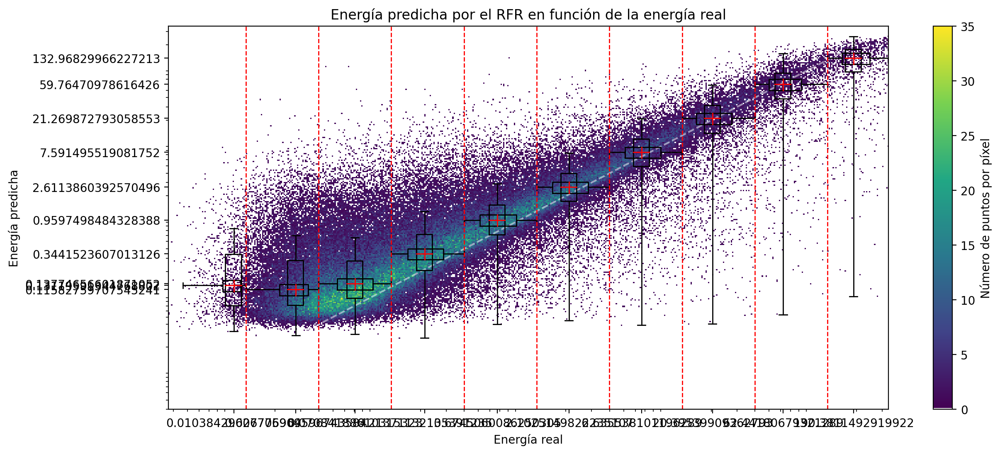

In [113]:
x = [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500]
xi = list(range(len(x)))

# Voy a hacer unos boxplots que creo que son útiles a la hora de mostrar estos resultados
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
using_mpl_scatter_density(fig, y_test, y_pred)
plt.xlabel('Energía real')
plt.ylabel('Energía predicha')
plt.axline((1, 1), slope=1, alpha = 0.5, c="white", ls='--')
plt.ylim(0.003, 350)
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')
plt.boxplot([pred1, pred2, pred3, pred4, pred5, pred6, pred7, pred8, pred9, pred10],
            positions = [medianatrue1, medianatrue2, medianatrue3, medianatrue4, medianatrue5, medianatrue6, medianatrue7, medianatrue8, medianatrue9, medianatrue10],
            widths = [medianatrue1/4, medianatrue2/4, medianatrue3/4, medianatrue4/4, medianatrue5/4, medianatrue6/4, medianatrue7/4, medianatrue8/4, medianatrue9/4, medianatrue10/4],
            sym='',
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))

plt.boxplot([test1, test2, test3, test4, test5, test6, test7, test8, test9, test10],
            positions = [mediana1, mediana2, mediana3, mediana4, mediana5, mediana6, mediana7, mediana8, mediana9, mediana10],
            widths = [mediana1/3, mediana2/3, mediana3/3, mediana4/3, mediana5/3, mediana6/3, mediana7/3, mediana8/3, mediana9/3, mediana10/3],
            sym='',
            vert = False,
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))

plt.axvline(test2[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test3[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test4[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test5[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test6[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test7[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test8[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test9[0], color='r', linestyle='dashed', linewidth=1)
plt.axvline(test10[0], color='r', linestyle='dashed', linewidth=1)
plt.show()

In [114]:
# Preparamos la representación
import mpl_scatter_density # adds projection='scatter_density'
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

# "Viridis-like" colormap with white background
white_viridis = LinearSegmentedColormap.from_list('white_viridis', [
    (0, '#ffffff'),
    (1e-20, '#440053'),
    (0.2, '#404388'),
    (0.4, '#2a788e'),
    (0.6, '#21a784'),
    (0.8, '#78d151'),
    (1, '#fde624'),
], N=256)

def using_mpl_scatter_density2(fig, x, y):
    ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
    density = ax.scatter_density(x, y, cmap=white_viridis, alpha = 0.30)
    fig.colorbar(density, label='Número de puntos por píxel')

/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


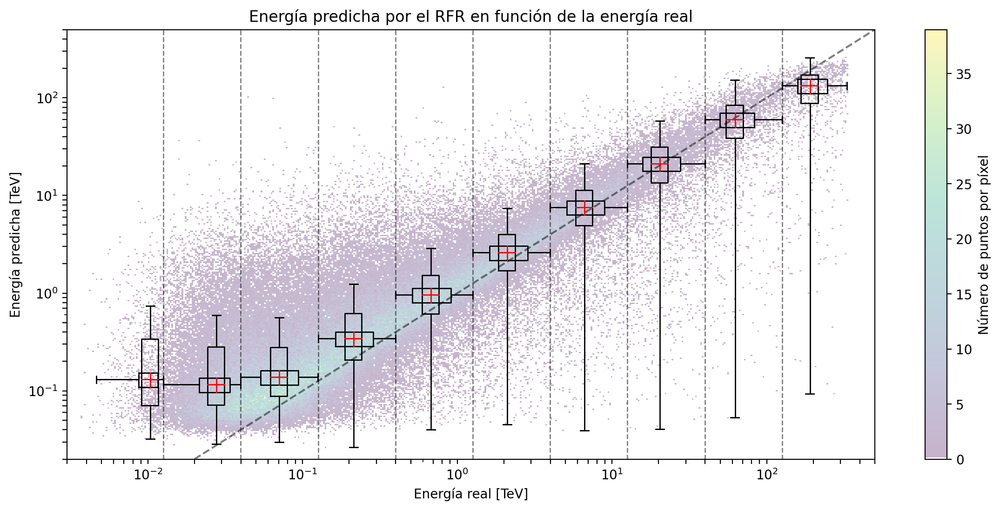

In [115]:
x = [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500]
xi = list(range(len(x)))

# Voy a hacer unos boxplots que creo que son útiles a la hora de mostrar estos resultados
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
using_mpl_scatter_density2(fig, y_test, y_pred)
plt.xlabel('Energía real [TeV]')
plt.ylabel('Energía predicha [TeV]')
plt.axline((1, 1), slope=1, alpha = 0.5, c="black", ls='--')
plt.ylim(0.02,450)
plt.xlim(0.003,450)
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')

my_xticks = [0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.5, 0.7, 0.8, 0.9, 1, 2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,200,300,400,500]
my_yticks = [0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.5, 0.7, 0.8, 0.9, 1, 2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,200,300,400,500]
my_xlabels = ['','','','','','','','$10^{-2}$','','','','','','','','', '$10^{-1}$','','','','','','','','', '$10^{0}$','','','','','','','','','$10^{1}$','','','','','','','','', '$10^{2}$','','','','']
my_ylabels = ['','','','','','','','', '$10^{-1}$','','','','','','','','', '$10^{0}$','','','','','','','','','$10^{1}$','','','','','','','','', '$10^{2}$','','','','']

plt.boxplot([pred1, pred2, pred3, pred4, pred5, pred6, pred7, pred8, pred9, pred10],
            positions = [medianatrue1, medianatrue2, medianatrue3, medianatrue4, medianatrue5, medianatrue6, medianatrue7, medianatrue8, medianatrue9, medianatrue10],
            widths = [medianatrue1/4, medianatrue2/4, medianatrue3/4, medianatrue4/4, medianatrue5/4, medianatrue6/4, medianatrue7/4, medianatrue8/4, medianatrue9/4, medianatrue10/4],
            sym='',
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))

plt.boxplot([test1, test2, test3, test4, test5, test6, test7, test8, test9, test10],
            positions = [mediana1, mediana2, mediana3, mediana4, mediana5, mediana6, mediana7, mediana8, mediana9, mediana10],
            widths = [mediana1/3, mediana2/3, mediana3/3, mediana4/3, mediana5/3, mediana6/3, mediana7/3, mediana8/3, mediana9/3, mediana10/3],
            sym='',
            vert = False,
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))
plt.xticks(my_xticks, my_xlabels)
plt.yticks(my_yticks, my_ylabels)

plt.axvline(test2[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test3[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test4[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test5[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test6[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test7[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test8[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test9[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test10[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)

fig.savefig('Boxplot.png')
plt.show()

[0.03230173188572129, 0.7385768735719224]
[0.13119591344768802]
[0.02863233097208043, 0.5958659180129567]
[0.11582759707545241]
[0.029769316205444436, 0.5635954048205167]
[0.13774656601871052]
[0.09351385463339587, 257.36005859375]
[132.96829966227213]


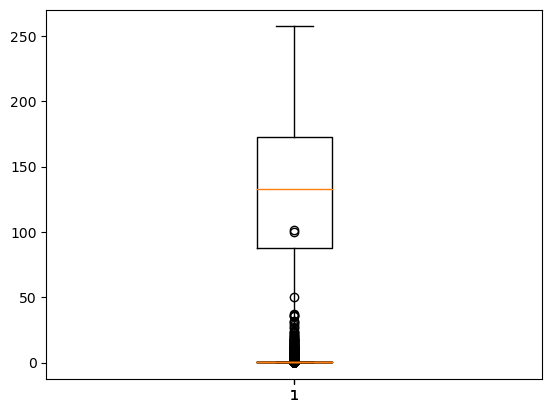

In [117]:
whis1 = plt.boxplot(pred1)
whis2 = plt.boxplot(pred2)
whis3 = plt.boxplot(pred3)
whis10 = plt.boxplot(pred10)
print([item.get_ydata()[1] for item in whis1['whiskers']])
print([item.get_ydata()[1] for item in whis1['medians']])
print([item.get_ydata()[1] for item in whis2['whiskers']])
print([item.get_ydata()[1] for item in whis2['medians']])
print([item.get_ydata()[1] for item in whis3['whiskers']])
print([item.get_ydata()[1] for item in whis3['medians']])
print([item.get_ydata()[1] for item in whis10['whiskers']])
print([item.get_ydata()[1] for item in whis10['medians']])

[0.004646105691790581, 0.012585083954036236]
[0.01038429606705904]
[0.012592184357345104, 0.03980971872806549]
[0.027776969596743584]
[0.0398116409778595, 0.12588495016098022]
[0.07084188610315323]
[125.9507064819336, 329.8990478515625]
[190.3811492919922]


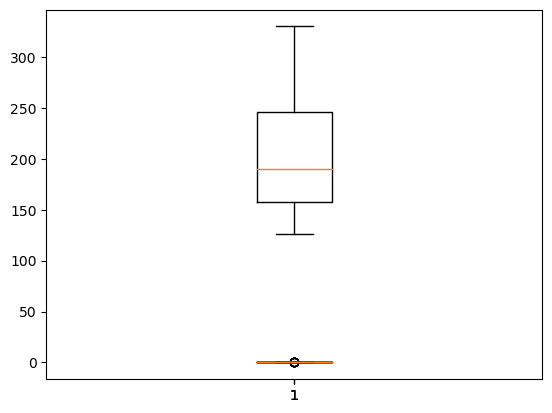

In [118]:
whis1 = plt.boxplot(test1)
whis2 = plt.boxplot(test2)
whis3 = plt.boxplot(test3)
whis10 = plt.boxplot(test10)
print([item.get_ydata()[1] for item in whis1['whiskers']])
print([item.get_ydata()[1] for item in whis1['medians']])
print([item.get_ydata()[1] for item in whis2['whiskers']])
print([item.get_ydata()[1] for item in whis2['medians']])
print([item.get_ydata()[1] for item in whis3['whiskers']])
print([item.get_ydata()[1] for item in whis3['medians']])
print([item.get_ydata()[1] for item in whis10['whiskers']])
print([item.get_ydata()[1] for item in whis10['medians']])

In [119]:
print(r2_score(pred1, test1))
print(r2_score(pred2, test2))
print(r2_score(pred3, test3))
print(r2_score(pred10, test10))
print()
print((mean_squared_error(pred1, test1))**(0.5))
print((mean_squared_error(pred2, test2))**(0.5))
print((mean_squared_error(pred3, test3))**(0.5))
print((mean_squared_error(pred10, test10)**(0.5)))
print()
print(r2_score(y_pred, y_test))
print(mean_squared_error(y_pred, y_test))

-0.2560107422682054
-0.13788478328675402
-0.05913808731925707
-2.176562456980574

0.7945148504239508
0.8871138704131218
1.1779165561996583
104.34717603638418

0.5729356637983454
112.23789402052064


/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


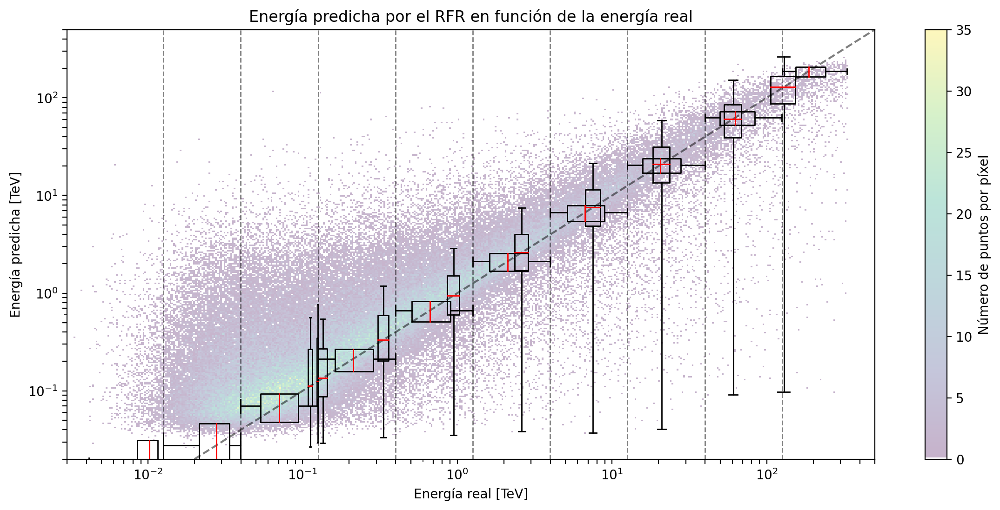

In [46]:
x = [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100, 500]
xi = list(range(len(x)))

# Voy a hacer unos boxplots que creo que son útiles a la hora de mostrar estos resultados
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
using_mpl_scatter_density2(fig, y_test, y_pred)
plt.xlabel('Energía real [TeV]')
plt.ylabel('Energía predicha [TeV]')
plt.axline((1, 1), slope=1, alpha = 0.5, c="black", ls='--')
plt.ylim(0.02,450)
plt.xlim(0.003,450)
plt.yscale('log')
plt.xscale('log')
plt.title('Energía predicha por el RFR en función de la energía real')

my_xticks = [0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.5, 0.7, 0.8, 0.9, 1, 2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,200,300,400,500]
my_yticks = [0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.2, 0.3, 0.4, 0.5, 0.5, 0.7, 0.8, 0.9, 1, 2,3,4,5,6,7,8,9,10,20,30,40,50,60,70,80,90,100,200,300,400,500]
my_xlabels = ['','','','','','','','$10^{-2}$','','','','','','','','', '$10^{-1}$','','','','','','','','', '$10^{0}$','','','','','','','','','$10^{1}$','','','','','','','','', '$10^{2}$','','','','']
my_ylabels = ['','','','','','','','', '$10^{-1}$','','','','','','','','', '$10^{0}$','','','','','','','','','$10^{1}$','','','','','','','','', '$10^{2}$','','','','']

plt.boxplot([pred1, pred2, pred3, pred4, pred5, pred6, pred7, pred8, pred9, pred10],
            positions = [mediana1, mediana2, mediana3, mediana4, mediana5, mediana6, mediana7, mediana8, mediana9, mediana10],            
            widths = [medianatrue1/4, medianatrue2/4, medianatrue3/4, medianatrue4/4, medianatrue5/4, medianatrue6/4, medianatrue7/4, medianatrue8/4, medianatrue9/4, medianatrue10/4],
            sym='',
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))

plt.boxplot([test1, test2, test3, test4, test5, test6, test7, test8, test9, test10],
            positions = [medianatrue1, medianatrue2, medianatrue3, medianatrue4, medianatrue5, medianatrue6, medianatrue7, medianatrue8, medianatrue9, medianatrue10],
            widths = [mediana1/3, mediana2/3, mediana3/3, mediana4/3, mediana5/3, mediana6/3, mediana7/3, mediana8/3, mediana9/3, mediana10/3],
            sym='',
            vert = False,
            boxprops=dict(color='k'),
            capprops=dict(color='k'),
            whiskerprops=dict(color='k'),
            medianprops=dict(color='r'))
plt.xticks(my_xticks, my_xlabels)
plt.yticks(my_yticks, my_ylabels)

plt.axvline(test2[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test3[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test4[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test5[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test6[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test7[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test8[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test9[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)
plt.axvline(test10[0], color='k', linestyle='dashed', linewidth=1, alpha=0.5)

plt.show()

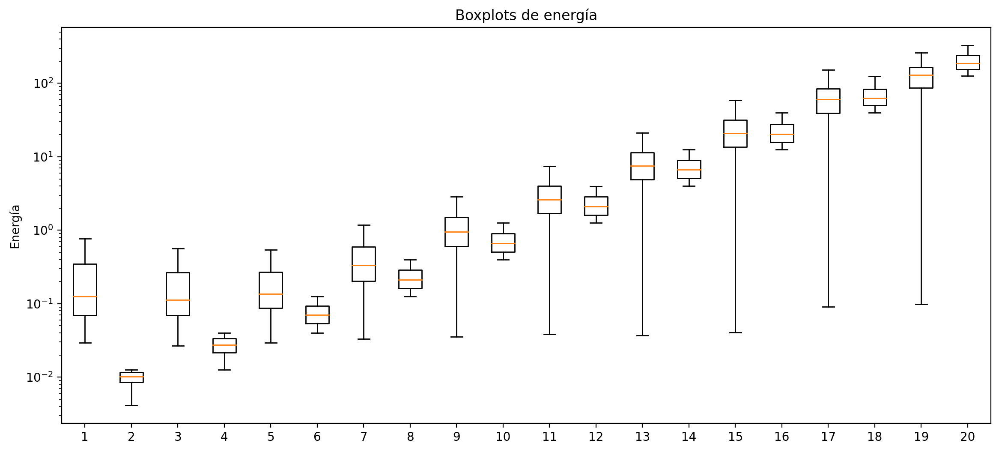

In [174]:
# Crear la figura y los ejes
fig = plt.figure(figsize=(14, 6), dpi=200)
# Trazar los boxplots para cada array
plt.boxplot([pred1, test1, pred2, test2, pred3, test3, pred4, test4, pred5, test5, 
            pred6, test6, pred7, test7, pred8, test8, pred9, test9, pred10, test10], sym='')
# Personalizar la figura
plt.title('Boxplots de energía')
plt.ylabel('Energía')
# Mostrar la figura
plt.yscale('log')
plt.show()

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctapipe.io import TableLoader, read_table
import scipy

# RandomForest
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.datasets import make_regression
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Distribución del clasificador
import scipy.stats as stats

/tmp/ipykernel_12783/1269661234.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctapipe.io import TableLoader

# RandomForest
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Cargamos imágenes
with TableLoader("../datos/proton.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=1647471)
with TableLoader("../datos/proton_with_images_00.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events2 = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=82178)

# Determinamos los parámetros
features = [
 #'obs_id',
 #'event_id',                          
 #'tel_id',
 'hillas_intensity',
 'hillas_skewness',
 'hillas_kurtosis',
 #'hillas_r',
 #'hillas_phi',
 'hillas_length',
 'hillas_width',
 #'hillas_psi',
 #'timing_intercept',
 #'timing_deviation',
 'timing_slope',
 #'leakage_intensity_width_2',
 'true_energy'
]

protons_tel_events_f = protons_tel_events[features]
protons_tel_events_f2 = protons_tel_events2[features]

# Convertimos a dataframe
df_proton = protons_tel_events_f.to_pandas()
df_proton = df_proton.dropna()
df_proton2 = protons_tel_events_f2.to_pandas()
df_proton2 = df_proton2.dropna()

# Juntamos los dataframes
df_protonT = pd.concat([df_proton, df_proton2], axis=0)   

X = df_proton.drop("true_energy", axis=1)                                              # Determina los parámetros 
y = df_proton["true_energy"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)
rf = RandomForestRegressor(max_features = "sqrt", n_estimators=150)
rf.fit(X_train, y_train)

RandomForestRegressor(max_features='sqrt', n_estimators=150)

In [33]:
# Cargamos las imágenes REALES con TRIGGER TYPE
tablename = "/dl2/event/telescope/parameters/LST_LSTCam"
file = "../datos/dl2_LST-1.Run02949.h5"
tb = pd.read_hdf(file, tablename)

# Las columnas deben estar en el mismo orden que en el fit (las de MC)
features = [
            #'obs_id',
            #'event_id',
            'intensity',
            'skewness',
            'kurtosis',
            #'log_intensity',
            #'x',
            #'y',
            #'r',
            #'phi',
            'length',
            #'length_uncertainty',
            'width',
            #'width_uncertainty',
            #'psi',
            'time_gradient',
            #'intercept',
            #'leakage_intensity_width_1',
            #'leakage_intensity_width_2',
            #'leakage_pixels_width_1',
            #'leakage_pixels_width_2',
            #'n_pixels',
            #'concentration_cog',
            #'concentration_core',
            #'concentration_pixel',
            #'n_islands',
            #'alt_tel',
            #'az_tel',
            #'calibration_id',
            #'dragon_time',
            #'ucts_time',
            #'tib_time',
            #'ucts_jump',
            #'mc_type',
            #'wl',
            #'tel_id',
            #'tel_pos_x',
            #'tel_pos_y',
            #'tel_pos_z',
            #'trigger_type',
            #'ucts_trigger_type',
            #'trigger_time',
            'event_type',
            #'delta_t',
            #'log_reco_energy',
            #'reco_energy',
            #'reco_disp_norm',
            #'reco_disp_sign',
            #'reco_disp_dx',
            #'reco_disp_dy',
            #'reco_src_x',
            #'reco_src_y',
            #'signed_time_gradient',
            #'signed_skewness',
            #'reco_alt',
            #'reco_az',
            #'reco_type',
            #'gammaness'
            ]

In [34]:
# Sacamos nuestro dataframe de datos reales con la columna extra de event_type
df_realR = tb[features]
df_realR = df_realR.dropna()

# Debemos cambiar el nombre de las features para que sean el mismo que el de MC ya que sino el RF no sabrá cuál es cuál
df_realR.rename(columns={'intensity': 'hillas_intensity', 'length': 'hillas_length', 'width': 'hillas_width', 'skewness': 'hillas_skewness',
                        'kurtosis': 'hillas_kurtosis', 'time_gradient': 'timing_slope'}, inplace=True)

# Filtramos nuestro dataframe para únicamente los eventos de tipo 32 y 2 (nos quita los eventos de tipo 0)
df_realR = df_realR[(df_realR['event_type'] >= 2)]

# Eliminamos la columna de event_type del dataframe ya filtrado y ya tendríamos nuestros datos para el modelo
XrealR = df_realR.drop("event_type", axis=1)

In [35]:
# Hacemos predicciones con el modelo con los datos ya buenos:
y_pred_real = rf.predict(XrealR)
y_pred_simu = rf.predict(X_test)

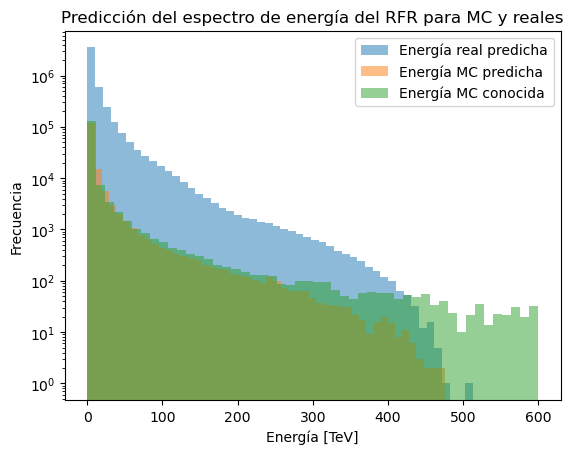

In [36]:
# Representamos ahora como es el espectro de los dos
plt.hist(y_pred_real, bins=50, alpha = 0.5, label = "Energía real predicha")
plt.hist(y_pred_simu, bins=50, alpha = 0.5, label = "Energía MC predicha")
plt.hist(y_test, bins=50, alpha = 0.5, label = "Energía MC conocida")
plt.yscale('log')
plt.ylabel('Frecuencia')
plt.xlabel('Energía [TeV]')
plt.title('Predicción del espectro de energía del RFR para MC y reales')
plt.legend()
plt.show()

In [37]:
import matplotlib.patches as mpatches

def plot_loghist(x, bins):
    hist, bins = np.histogram(x, bins=bins)
    logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]), len(bins))
    plt.hist(x, bins=logbins, alpha = 0.5, density=True, histtype=u'step')

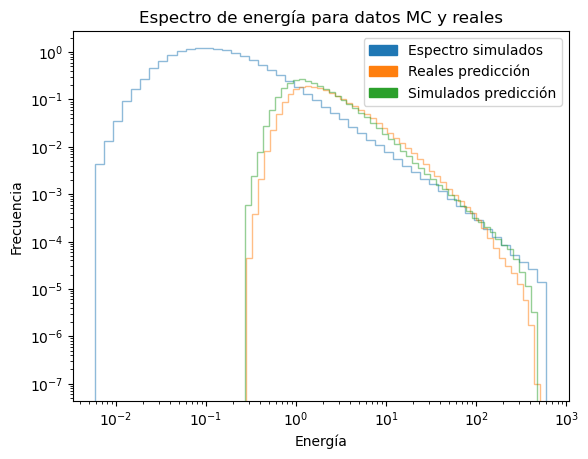

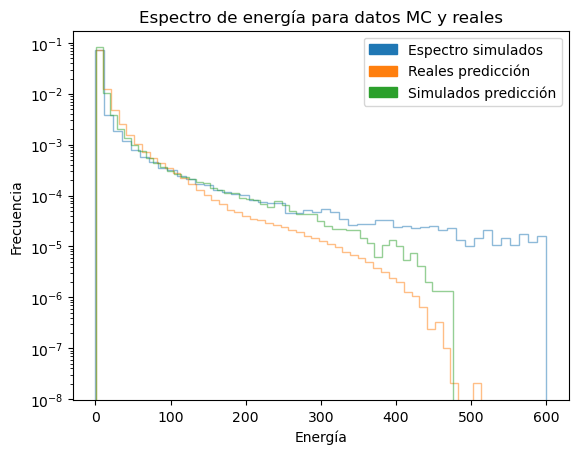

In [38]:
# Como de los datos reales no sabemos la true_energy podemos representar el espectro
plot_loghist(y, 50)
plot_loghist(y_pred_real, 50)
plot_loghist(y_pred_simu, 50)

plt.yscale('log')
plt.xscale('log')
plt.ylabel('Frecuencia')
plt.xlabel('Energía')
plt.title('Espectro de energía para datos MC y reales')
simulados = mpatches.Patch(color='#2ca02c', label='Simulados predicción')
reales = mpatches.Patch(color='#ff7f0e', label='Reales predicción')
simulados2 = mpatches.Patch(color='#1f77b4', label='Espectro simulados')
plt.legend(handles=[simulados2, reales, simulados])
plt.show()

# Como de los datos reales no sabemos la true_energy podemos representar el espectro
plt.hist(y, 50, alpha = 0.5, density=True, histtype=u'step')
plt.hist(y_pred_real, 50, alpha = 0.5, density=True, histtype=u'step')
plt.hist(y_pred_simu, 50, alpha = 0.5, density=True, histtype=u'step')
plt.yscale('log')
plt.ylabel('Frecuencia')
plt.xlabel('Energía')
plt.title('Espectro de energía para datos MC y reales')
simulados = mpatches.Patch(color='#2ca02c', label='Simulados predicción')
reales = mpatches.Patch(color='#ff7f0e', label='Reales predicción')
simulados2 = mpatches.Patch(color='#1f77b4', label='Espectro simulados')
plt.legend(handles=[simulados2, reales, simulados])
plt.show()

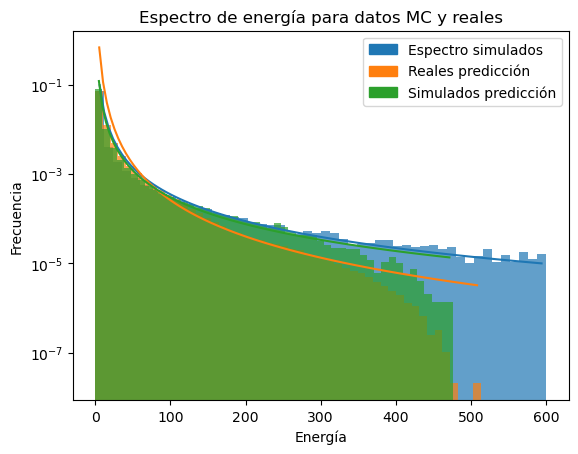

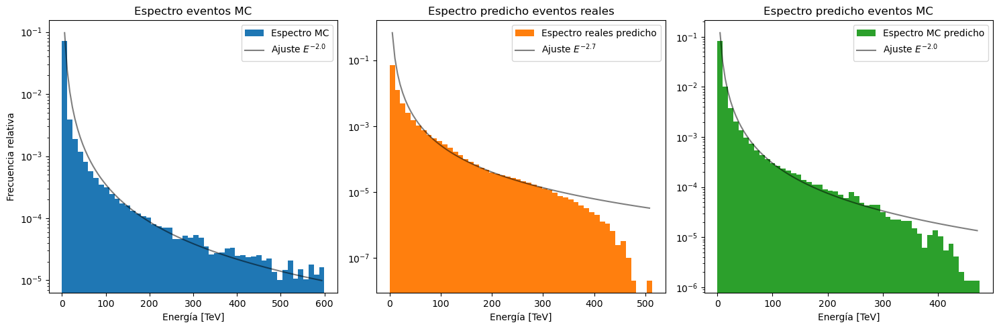

In [39]:
# Calcular el histograma
hist, bin_edges = np.histogram(y, bins=50, density=True)
hist2, bin_edges2 = np.histogram(y_pred_real, bins=50, density=True)
hist3, bin_edges3 = np.histogram(y_pred_simu, bins=50, density=True)

# Calcular los centros de los bins
x_data = (bin_edges[1:] + bin_edges[:-1]) / 2
x_data2 = (bin_edges2[1:] + bin_edges2[:-1]) / 2
x_data3 = (bin_edges3[1:] + bin_edges3[:-1]) / 2

# Generar datos para la curva ajustada
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = 3.5*x_fit**(-2.0)
x_fit2 = np.linspace(min(x_data2), max(x_data2), 100)
y_fit2 = 65*x_fit2**(-2.7)
x_fit3 = np.linspace(min(x_data3), max(x_data3), 100)
y_fit3 = 3*x_fit3**(-2.0)

# Graficar histograma y curva ajustada
plt.hist(y, 50, alpha = 0.7, density=True)
plt.hist(y_pred_real, 50, alpha = 0.7, density=True)
plt.hist(y_pred_simu, 50, alpha = 0.7, density=True)

plt.plot(x_fit, y_fit, '#1f77b4')
plt.plot(x_fit2, y_fit2, '#ff7f0e')
plt.plot(x_fit3, y_fit3, '#2ca02c')

plt.yscale('log')
plt.ylabel('Frecuencia')
plt.xlabel('Energía')
plt.title('Espectro de energía para datos MC y reales')
simulados = mpatches.Patch(color='#2ca02c', label='Simulados predicción')
reales = mpatches.Patch(color='#ff7f0e', label='Reales predicción')
simulados2 = mpatches.Patch(color='#1f77b4', label='Espectro simulados')
plt.legend(handles=[simulados2, reales, simulados])
plt.show()

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].hist(y, 50, color='#1f77b4', density=True, label = 'Espectro MC')
axs[0].plot(x_fit, y_fit, 'k', alpha = 0.5, label='Ajuste $E^{-2.0}$')
axs[0].set_yscale('log')
axs[0].set_ylabel('Frecuencia relativa')
axs[0].set_xlabel('Energía [TeV]')
axs[0].set_title('Espectro eventos MC')
axs[0].legend()

axs[1].hist(y_pred_real, 50, color='#ff7f0e', density=True, label = 'Espectro reales predicho')
axs[1].plot(x_fit2, y_fit2, 'k', alpha = 0.5, label='Ajuste $E^{-2.7}$')
axs[1].set_yscale('log')
axs[1].set_xlabel('Energía [TeV]')
axs[1].set_title('Espectro predicho eventos reales')
axs[1].legend()

axs[2].hist(y_pred_simu, 50, color='#2ca02c', density=True, label = 'Espectro MC predicho')
axs[2].plot(x_fit3, y_fit3, 'k', alpha = 0.5, label='Ajuste $E^{-2.0}$')
axs[2].set_yscale('log')
axs[2].set_xlabel('Energía [TeV]')
axs[2].set_title('Espectro predicho eventos MC')
axs[2].legend()

plt.tight_layout()

fig.savefig('Espectro energía.png')
plt.show()

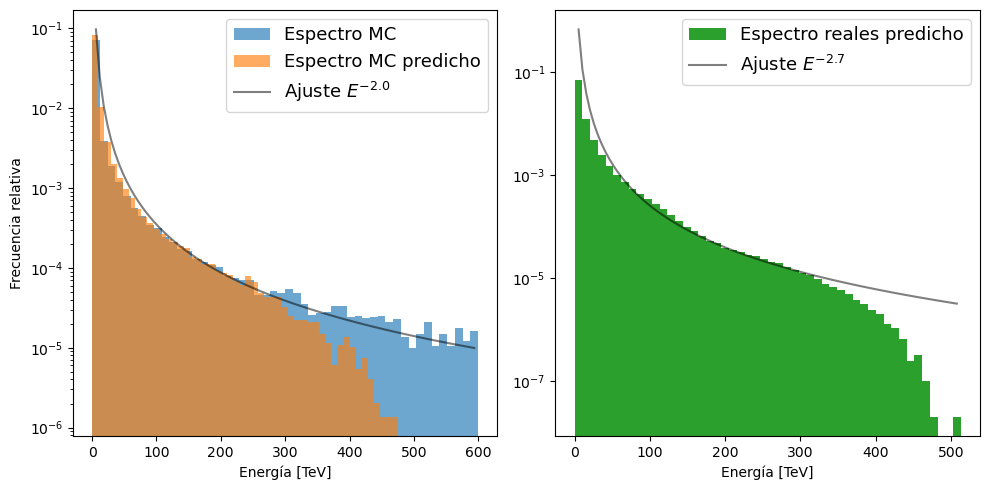

In [67]:
# Calcular el histograma
hist, bin_edges = np.histogram(y, bins=50, density=True)
hist2, bin_edges2 = np.histogram(y_pred_real, bins=50, density=True)
hist3, bin_edges3 = np.histogram(y_pred_simu, bins=50, density=True)

# Calcular los centros de los bins
x_data = (bin_edges[1:] + bin_edges[:-1]) / 2
x_data2 = (bin_edges2[1:] + bin_edges2[:-1]) / 2
x_data3 = (bin_edges3[1:] + bin_edges3[:-1]) / 2

# Generar datos para la curva ajustada
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = 3.5*x_fit**(-2.0)
x_fit2 = np.linspace(min(x_data2), max(x_data2), 100)
y_fit2 = 65*x_fit2**(-2.7)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].hist(y, 50, color='#1f77b4', alpha = 0.65, density=True, label = 'Espectro MC')
axs[0].hist(y_pred_simu, 50, color='#ff7f0e', alpha = 0.65, density=True, label = 'Espectro MC predicho')
axs[0].plot(x_fit, y_fit, 'k', alpha = 0.5, label='Ajuste $E^{-2.0}$')
axs[0].set_yscale('log')
axs[0].set_ylabel('Frecuencia relativa')
axs[0].set_xlabel('Energía [TeV]')
axs[0].legend(loc=1, prop={'size': 13})

axs[1].hist(y_pred_real, 50, color='#2ca02c', density=True, label = 'Espectro reales predicho')
axs[1].plot(x_fit2, y_fit2, 'k', alpha = 0.5, label='Ajuste $E^{-2.7}$')
axs[1].set_yscale('log')
axs[1].set_xlabel('Energía [TeV]')
axs[1].legend(loc=1, prop={'size': 13})

plt.tight_layout()

fig.savefig('Espectro energía 2.png')
plt.show()

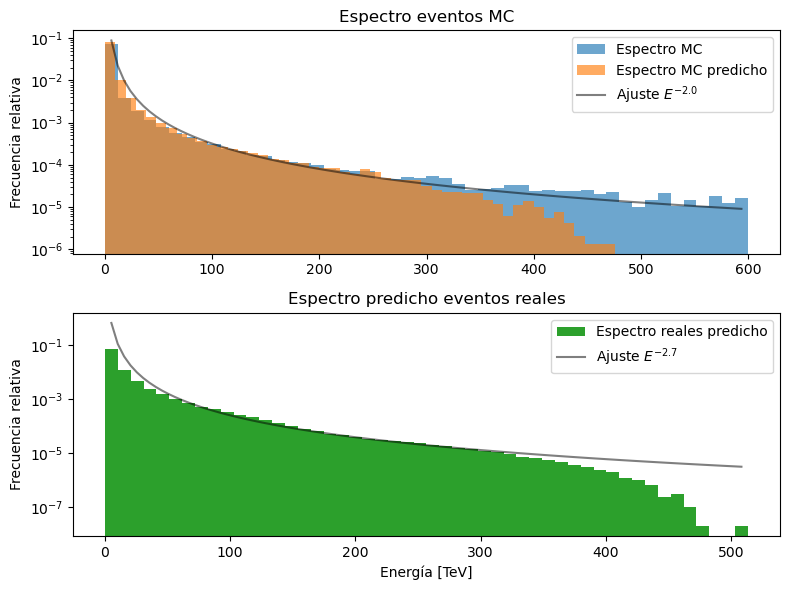

In [61]:
# Calcular el histograma
hist, bin_edges = np.histogram(y, bins=50, density=True)
hist2, bin_edges2 = np.histogram(y_pred_real, bins=50, density=True)
hist3, bin_edges3 = np.histogram(y_pred_simu, bins=50, density=True)

# Calcular los centros de los bins
x_data = (bin_edges[1:] + bin_edges[:-1]) / 2
x_data2 = (bin_edges2[1:] + bin_edges2[:-1]) / 2
x_data3 = (bin_edges3[1:] + bin_edges3[:-1]) / 2

# Generar datos para la curva ajustada
x_fit = np.linspace(min(x_data), max(x_data), 100)
y_fit = 3.2*x_fit**(-2.0)
x_fit2 = np.linspace(min(x_data2), max(x_data2), 100)
y_fit2 = 65*x_fit2**(-2.7)

fig, axs = plt.subplots(2, 1, figsize=(8,6))

axs[0].hist(y, 50, color='#1f77b4', alpha = 0.65, density=True, label = 'Espectro MC')
axs[0].hist(y_pred_simu, 50, color='#ff7f0e', alpha = 0.65, density=True, label = 'Espectro MC predicho')
axs[0].plot(x_fit, y_fit, 'k', alpha = 0.5, label='Ajuste $E^{-2.0}$')
axs[0].set_yscale('log')
axs[0].set_ylabel('Frecuencia relativa')
axs[0].set_title('Espectro eventos MC')
axs[0].legend(loc=1, prop={'size': 10})

axs[1].hist(y_pred_real, 50, color='#2ca02c', density=True, label = 'Espectro reales predicho')
axs[1].plot(x_fit2, y_fit2, 'k', alpha = 0.5, label='Ajuste $E^{-2.7}$')
axs[1].set_yscale('log')
axs[1].set_ylabel('Frecuencia relativa')
axs[1].set_xlabel('Energía [TeV]')
axs[1].set_title('Espectro predicho eventos reales')
axs[1].legend(loc=1, prop={'size': 10})

plt.tight_layout()

fig.savefig('Espectro energía 2.png')
plt.show()

In [2]:
# RandomForest
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split

# Cargamos imágenes SIMULADAS
with TableLoader("../datos/proton.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=1647471)
with TableLoader("../datos/gamma-diffuse.dl2.h5", load_dl1_images=True,load_dl2=True, load_simulated=True) as loader_g:
    gamma_tel_events = loader_g.read_telescope_events("LST_LST_LSTCam", start=0, stop=1452118)

with TableLoader("../datos/proton_with_images_00.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events2 = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=82178)
with TableLoader("../datos/gamma-diffuse_with_images_00.dl2.h5", load_dl1_images=True,load_dl2=True, load_simulated=True) as loader_g:
    gamma_tel_events2 = loader_g.read_telescope_events("LST_LST_LSTCam", start=0, stop=33922
)

# Determinamos los parámetros
features = [
 #'obs_id',
 #'event_id',                          
 #'tel_id',
 'hillas_intensity',
 'hillas_skewness',
 'hillas_kurtosis',
 #'hillas_r',
 #'hillas_phi',
 'hillas_length',
 'hillas_width',
 #'hillas_psi',
 #'timing_intercept',
 #'timing_deviation',
 'timing_slope',
 #'leakage_intensity_width_2',
 #'true_energy'
]

protons_tel_events_f = protons_tel_events[features] 
gamma_tel_events_f=gamma_tel_events[features]
protons_tel_events_f2 = protons_tel_events2[features] 
gamma_tel_events_f2=gamma_tel_events2[features]

# Convertimos a dataframe
df_protons = protons_tel_events_f.to_pandas()
df_protons = df_protons.dropna()
df_protons = df_protons[(df_protons['hillas_intensity']>200)]

df_protons2 = protons_tel_events_f2.to_pandas()
df_protons2 = df_protons2.dropna()
df_protons2 = df_protons2[(df_protons2['hillas_intensity']>200)]

df_gamma = gamma_tel_events_f.to_pandas()
df_gamma = df_gamma.dropna()
df_gamma = df_gamma[(df_gamma['hillas_intensity']>200)]

df_gamma2 = gamma_tel_events_f2.to_pandas()
df_gamma2 = df_gamma2.dropna()
df_gamma2 = df_gamma2[(df_gamma2['hillas_intensity']>200)]

# Juntamos los cuatro dataframe
df_protongamma = pd.concat([df_protons, df_protons2, df_gamma, df_gamma2], axis=0)

# Creamos la etiqueta para que el modelo pueda comprobar sus resultados
label = []                                                                                             
for i in range(len(df_protons)):
    label.append(1)                                                                   # Nombramos los protones como 1
for i2 in range(len(df_protons2)):
    label.append(1)
for j in range(len(df_gamma)):
    label.append(0)                                                                   # Nombramos los gamma como 0
for j2 in range(len(df_gamma2)):
    label.append(0)
    
df_protongamma.insert(6,"label", label, True)

Xc = df_protongamma.drop("label", axis=1)                                              # Determina los parámetros 
yc = df_protongamma["label"]

In [3]:
X_train, X_test, y_train, y_test = train_test_split(Xc, yc, test_size=0.25)
rfh = RandomForestClassifier(max_depth=19, n_estimators=150)
rfh.fit(X_train, y_train)

RandomForestClassifier(max_depth=19, n_estimators=150)

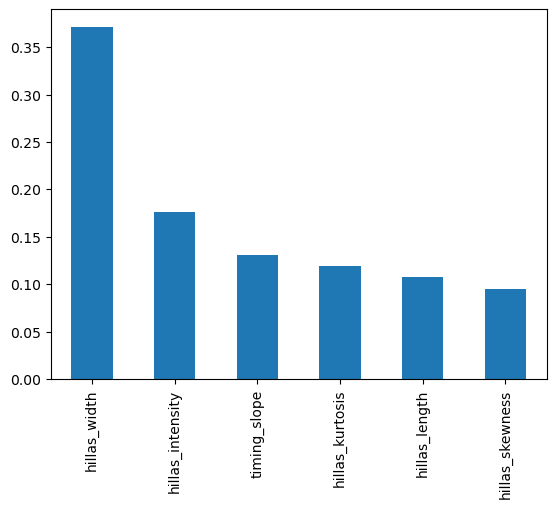

hillas_width        0.371302
hillas_intensity    0.176053
timing_slope        0.130995
hillas_kurtosis     0.119674
hillas_length       0.107251
hillas_skewness     0.094724
dtype: float64


In [31]:
feature_importances = pd.Series(rfh.feature_importances_, index=Xc.columns).sort_values(ascending=False)
feature_importances.plot.bar()
plt.show()
print(feature_importances)

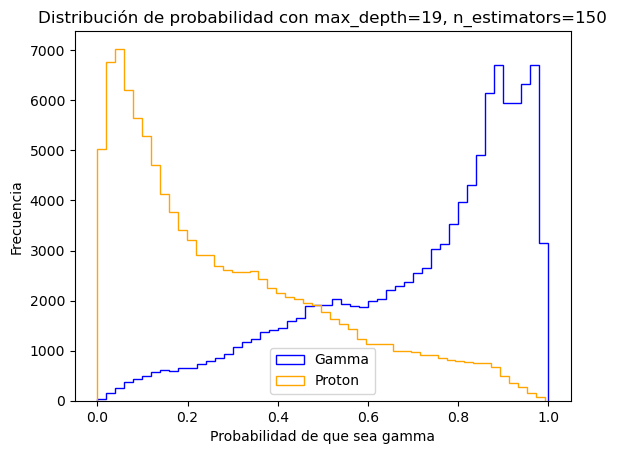

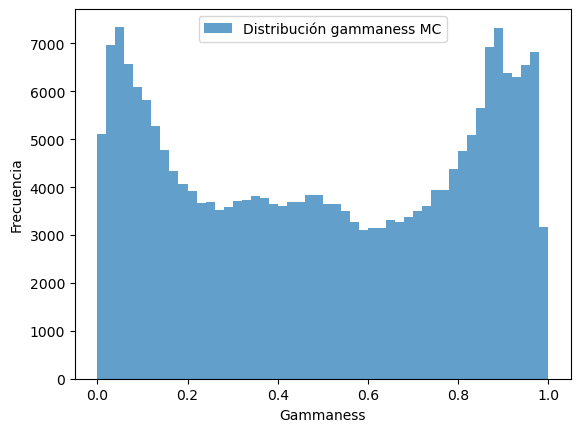

In [11]:
y_pred = (rfh.predict_proba(X_test))
proba = y_pred[:,0]                                                                             # Probabilidad de que el suceso sea un gamma
label = y_test                                                                                   # Etiqueta real del suceso
    
# Asignamos a cada probabilidad que devuelve el RF la etiqueta real del suceso
prob_gamma = proba[label == 0]
prob_proton = proba[label == 1]

plt.hist(prob_gamma, bins=50, histtype=u'step', color = 'blue', label='Gamma')  
plt.hist(prob_proton, bins=50, histtype=u'step', color = 'orange', label='Proton')  

plt.title("Distribución de probabilidad con max_depth=19, n_estimators=150")
plt.xlabel("Probabilidad de que sea gamma")
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

# Representamos ahora cómo es el espectro de las predicciones
plt.hist(proba, bins=50, alpha = 0.7, label = "Distribución gammaness MC")
plt.ylabel('Frecuencia')
plt.xlabel('Gammaness')
plt.legend()
plt.show()

In [8]:
# Cargamos las imágenes REALES
tablename = "/dl2/event/telescope/parameters/LST_LSTCam"
file = "../datos/dl2_LST-1.Run02949.h5"
tb = pd.read_hdf(file, tablename)

# Las columnas deben estar en el mismo orden que en el fit (las de MC)
features = [
            #'obs_id',
            #'event_id',
            'intensity',
            'skewness',
            'kurtosis',
            #'log_intensity',
            #'x',
            #'y',
            #'r',
            #'phi',
            'length',
            #'length_uncertainty',
            'width',
            #'width_uncertainty',
            #'psi',
            'time_gradient',
            #'intercept',
            #'leakage_intensity_width_1',
            #'leakage_intensity_width_2',
            #'leakage_pixels_width_1',
            #'leakage_pixels_width_2',
            #'n_pixels',
            #'concentration_cog',
            #'concentration_core',
            #'concentration_pixel',
            #'n_islands',
            #'alt_tel',
            #'az_tel',
            #'calibration_id',
            #'dragon_time',
            #'ucts_time',
            #'tib_time',
            #'ucts_jump',
            #'mc_type',
            #'wl',
            #'tel_id',
            #'tel_pos_x',
            #'tel_pos_y',
            #'tel_pos_z',
            #'trigger_type',
            #'ucts_trigger_type',
            #'trigger_time',
            'event_type',
            #'delta_t',
            #'log_reco_energy',
            #'reco_energy',
            #'reco_disp_norm',
            #'reco_disp_sign',
            #'reco_disp_dx',
            #'reco_disp_dy',
            #'reco_src_x',
            #'reco_src_y',
            #'signed_time_gradient',
            #'signed_skewness',
            #'reco_alt',
            #'reco_az',
            #'reco_type',
            'gammaness'
            ]

df_realC = tb[features]
df_realC = df_realC.dropna()
df_realC = df_realC[(df_realC['intensity']>300)]

# Debemos cambiar el nombre de las features para que sean el mismo que el de MC ya que sino el RF no sabrá cuál es cuál
df_realC.rename(columns={'intensity': 'hillas_intensity', 'length': 'hillas_length', 'width': 'hillas_width', 'skewness': 'hillas_skewness',
                        'kurtosis': 'hillas_kurtosis', 'time_gradient': 'timing_slope'}, inplace=True)

# Filtramos nuestro dataframe para únicamente los eventos de tipo 32 y 2 (nos quita los eventos de tipo 1)
df_realC = df_realC[(df_realC['event_type'] >= 2)]

# Eliminamos la columna de event_type del dataframe ya filtrado y ya tendríamos nuestros datos para el modelo
XrealC = df_realC.drop("event_type", axis=1)
XrealC = XrealC.drop("gammaness", axis=1)
yrealC = df_realC["gammaness"]

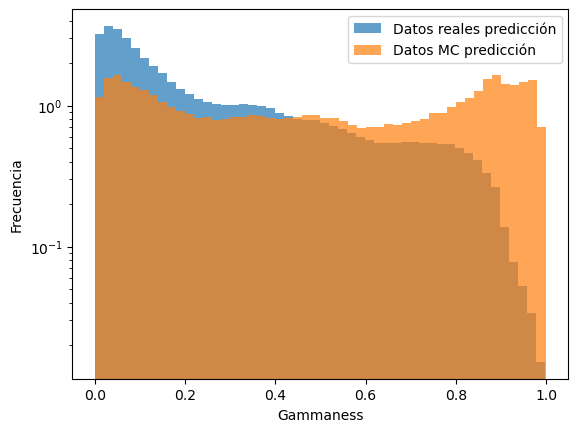

In [9]:
y_pred_real = (rfh.predict_proba(XrealC))
proba_real = y_pred_real[:,0] 

# Representamos ahora cómo es el espectro de las predicciones
plt.hist(proba_real, bins=50, density=True, alpha = 0.7, label = "Datos reales predicción")
plt.hist(proba, bins=50, density=True, alpha = 0.7, label = "Datos MC predicción")
plt.yscale('log')
plt.ylabel('Frecuencia')
plt.xlabel('Gammaness')
plt.legend()
plt.show()

In [14]:
y_pred_real = (rfh.predict_proba(XrealC))
proba_real = y_pred_real[:,0] 

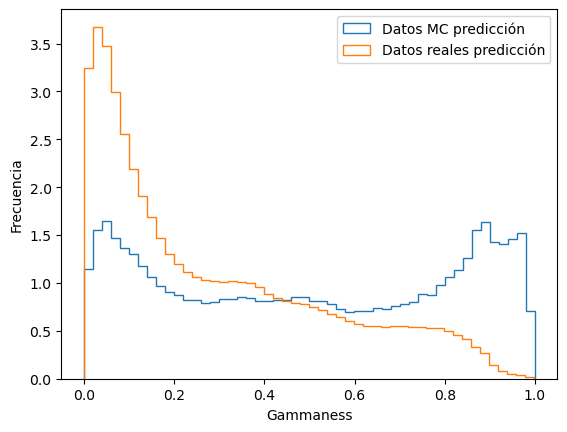

In [18]:
# Representamos ahora cómo es el espectro de las predicciones
plt.hist(proba, bins=50, density=True, histtype=u'step', label = "Datos MC predicción")
plt.hist(proba_real, bins=50, density=True, histtype=u'step', label = "Datos reales predicción")

plt.ylabel('Frecuencia')
plt.xlabel('Gammaness')
plt.legend()
plt.show()

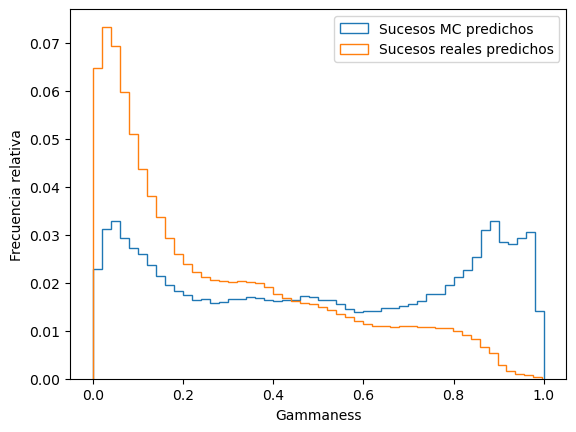

In [30]:
fig = plt.figure()
plt.hist(proba, weights=np.zeros_like(proba) + 1. / proba.size, bins=50, histtype=u'step', label = "Sucesos MC predichos")
plt.hist(proba_real, weights=np.zeros_like(proba_real) + 1. / proba_real.size, bins=50, histtype=u'step', label = "Sucesos reales predichos")
plt.ylabel('Frecuencia relativa')
plt.xlabel('Gammaness')
plt.legend()
fig.savefig('Espectro gammaness.png')
plt.show()

In [25]:
proba_real_norm = proba_real[0:7000]

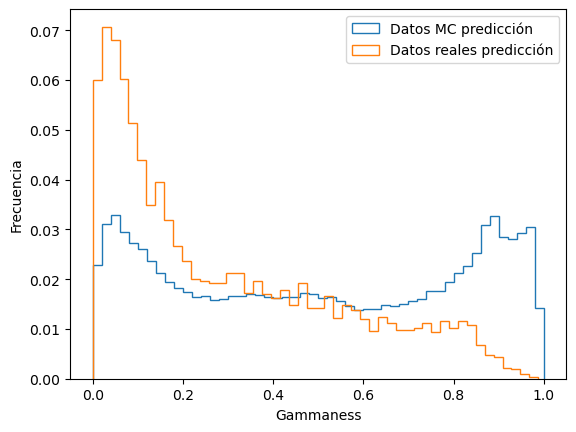

In [29]:
fig = plt.figure()
plt.hist(proba, weights=np.zeros_like(proba) + 1. / proba.size, bins=50, histtype=u'step', label = "Datos MC predicción")
plt.hist(proba_real_norm, weights=np.zeros_like(proba_real_norm) + 1. / proba_real_norm.size, bins=50, histtype=u'step', label = "Datos reales predicción")
plt.ylabel('Frecuencia')
plt.xlabel('Gammaness')
plt.legend()
plt.show()

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctapipe.io import TableLoader, read_table
import scipy
import seaborn as sns

# RandomForest
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.datasets import make_regression
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Distribución del clasificador
import scipy.stats as stats

In [29]:
# Cargamos imágenes SIMULADAS
with TableLoader("../datos/proton.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=1647471)
with TableLoader("../datos/proton_with_images_00.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events2 = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=82178)

# Determinamos los parámetros
features = ['hillas_intensity', 'hillas_skewness', 'hillas_kurtosis', 'hillas_length', 'hillas_width', 'timing_slope']
protons_tel_events_f = protons_tel_events[features] 
protons_tel_events_f2 = protons_tel_events2[features] 

# Convertimos a dataframe y eliminamos los NaN values
df_protons = protons_tel_events_f.to_pandas()
df_protons = df_protons.dropna()
df_protons = df_protons[(df_protons['hillas_intensity']>200)]
df_protons2 = protons_tel_events_f2.to_pandas()
df_protons2 = df_protons2.dropna()
df_protons2 = df_protons2[(df_protons2['hillas_intensity']>200)]
# Juntamos los dos dataframe
df_simu = pd.concat([df_protons, df_protons2], axis=0)

# Cargamos las imágenes REALES
tablename = "/dl2/event/telescope/parameters/LST_LSTCam"
file = "../datos/dl2_LST-1.Run02949.h5"
tb = pd.read_hdf(file, tablename)

# Las columnas deben estar en el mismo orden que en el fit (las de MC)
features = ['intensity', 'skewness', 'kurtosis', 'length', 'width', 'time_gradient', 'event_type']
df_realC = tb[features]
# Convertimos a dataframe y eliminamos los NaN values
df_realC = df_realC.dropna()
# Debemos cambiar el nombre de las features para que sean el mismo que el de MC ya que sino el RF no sabrá cuál es cuál
df_realC.rename(columns={'intensity': 'hillas_intensity', 'length': 'hillas_length', 'width': 'hillas_width', 'skewness': 'hillas_skewness',
                        'kurtosis': 'hillas_kurtosis', 'time_gradient': 'timing_slope'}, inplace=True)
# Filtramos nuestro dataframe para únicamente los eventos de tipo 32 y 2 (nos quita los eventos de tipo 0)
df_realC = df_realC[(df_realC['event_type'] >= 2)]
df_realC = df_realC.drop("event_type", axis=1)

df_realC = df_realC[(df_realC['hillas_intensity']>200)]
# Dataframe de datos reales
df_real = df_realC

# Filtramos los datos reales para que sean de la misma longitud que los simulados
df_real = df_real.head(df_simu.shape[0])

# Creamos la etiqueta para que el modelo pueda comprobar sus resultados
label = []                                                                                             
for i in range(len(df_simu)):
    label.append(1)                                                                   # Nombramos los simulados como 1
for j in range(len(df_real)):
    label.append(0)                                                                   # Nombramos los reales como 0

# Los concatenamos para juntar todos los datos en el mismo dataframe
df_simureal = pd.concat([df_simu, df_real], axis=0)

df_simureal.insert(6,"label", label, True)

X = df_simureal.drop("label", axis=1)
y = df_simureal["label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
rfrs = RandomForestClassifier(max_depth=19, n_estimators=150)
rfrs.fit(X_train, y_train)

RandomForestClassifier(max_depth=19, n_estimators=150)

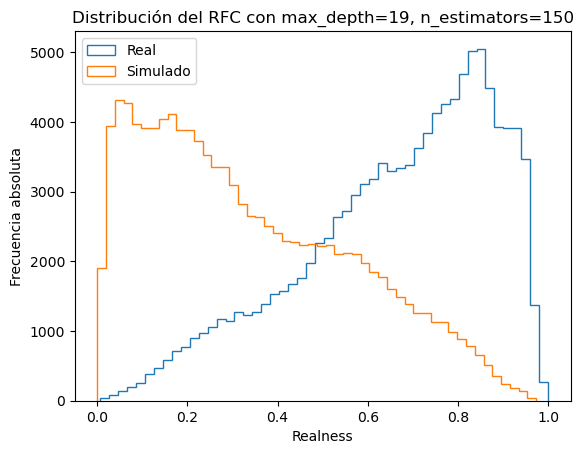

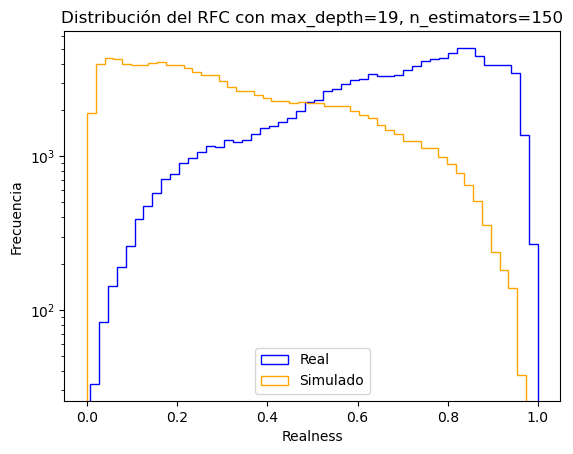

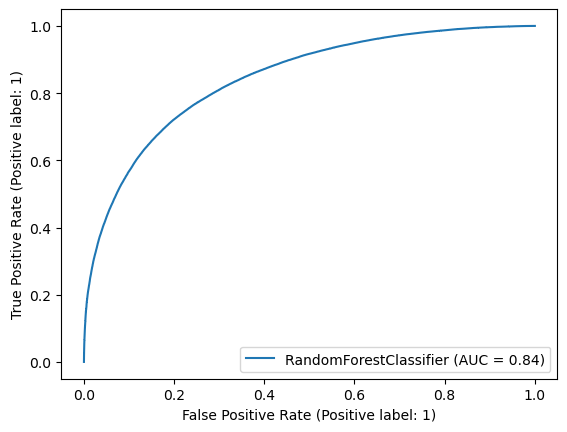

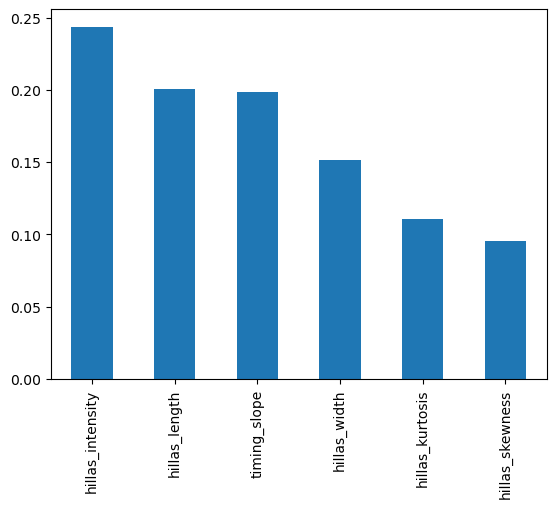

hillas_intensity    0.243462
hillas_length       0.200395
timing_slope        0.198447
hillas_width        0.151798
hillas_kurtosis     0.110742
hillas_skewness     0.095155
dtype: float64


In [30]:
y_pred = (rfrs.predict_proba(X_test))  
realness = y_pred[:,0]                                                                                  # Gammaness predicha
label = y_test                                                                                          # Etiqueta real del suceso
    
# Asignamos a cada probabilidad que devuelve el RF la etiqueta real del suceso
realness_real = realness[label == 0]
realness_simu = realness[label == 1]

fig = plt.figure()
plt.hist(realness_real, bins=50, histtype=u'step', label='Real')  
plt.hist(realness_simu, bins=50, histtype=u'step', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia absoluta')
plt.legend()
plt.show()
fig.savefig('Int200.png')

# Representamos el espectro en escala logarítmica
plt.hist(realness_real, bins=50, histtype=u'step', color = 'blue', label='Real')  
plt.hist(realness_simu, bins=50, histtype=u'step', color = 'orange', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia')
plt.yscale('log')
plt.legend()
plt.show()

from sklearn.metrics import RocCurveDisplay
ax = plt.gca()
rf_ROC_disp = RocCurveDisplay.from_estimator(rfrs, X_test, y_test, ax=ax)
plt.show()

feature_importances = pd.Series(rfrs.feature_importances_, index= X_test.columns).sort_values(ascending=False)
feature_importances.plot.bar()
plt.show()
print(feature_importances)

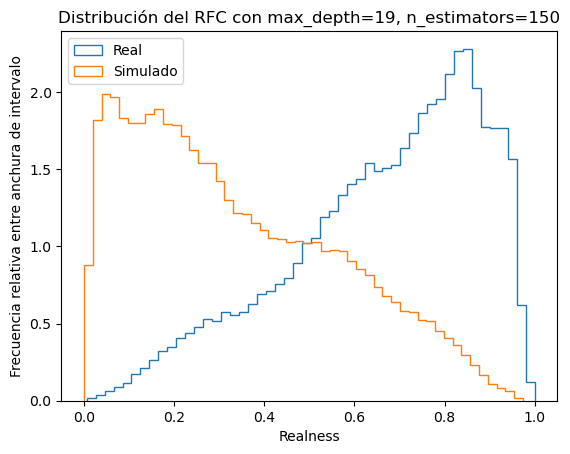

In [31]:
fig = plt.figure()
plt.hist(realness_real, bins=50, density = True, histtype=u'step', label='Real')  
plt.hist(realness_simu, bins=50, density = True, histtype=u'step', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia relativa entre anchura de intervalo')
plt.legend()
plt.show()
fig.savefig('Int200 2.png')

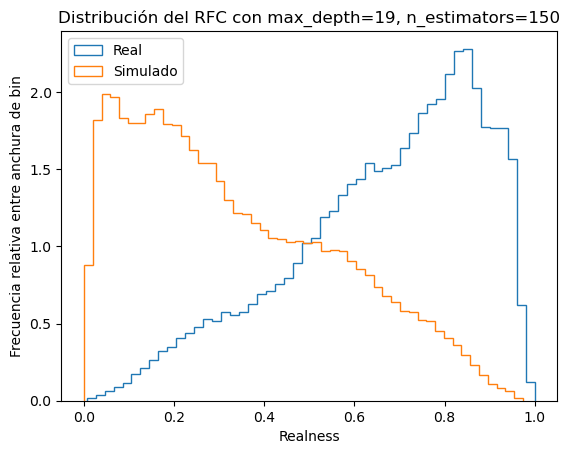

In [32]:
fig = plt.figure()
plt.hist(realness_real, bins=50, density = True, histtype=u'step', label='Real')  
plt.hist(realness_simu, bins=50, density = True, histtype=u'step', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia relativa entre anchura de bin')
plt.legend()
plt.show()
fig.savefig('Int200 22.png')

/tmp/ipykernel_29604/2211049817.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


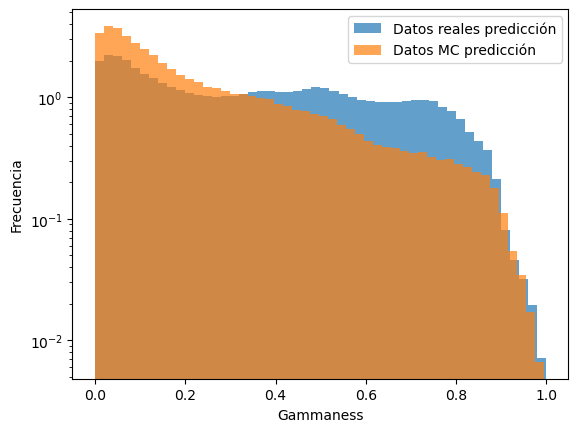

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctapipe.io import TableLoader, read_table
import scipy
import seaborn as sns

# RandomForest
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.datasets import make_regression
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Distribución del clasificador
import scipy.stats as stats

# Cargamos imágenes SIMULADAS
with TableLoader("../datos/proton.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=1647471)
with TableLoader("../datos/gamma-diffuse.dl2.h5", load_dl1_images=True,load_dl2=True, load_simulated=True) as loader_g:
    gamma_tel_events = loader_g.read_telescope_events("LST_LST_LSTCam", start=0, stop=1452118)

with TableLoader("../datos/proton_with_images_00.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events2 = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=82178)
with TableLoader("../datos/gamma-diffuse_with_images_00.dl2.h5", load_dl1_images=True,load_dl2=True, load_simulated=True) as loader_g:
    gamma_tel_events2 = loader_g.read_telescope_events("LST_LST_LSTCam", start=0, stop=33922
)

# Determinamos los parámetros
features = [
 #'obs_id',
 #'event_id',                          
 #'tel_id',
 'hillas_intensity',
 'hillas_skewness',
 'hillas_kurtosis',
 #'hillas_r',
 #'hillas_phi',
 'hillas_length',
 'hillas_width',
 #'hillas_psi',
 #'timing_intercept',
 #'timing_deviation',
 'timing_slope',
 #'leakage_intensity_width_2',
 #'true_energy'
]

protons_tel_events_f = protons_tel_events[features] 
gamma_tel_events_f=gamma_tel_events[features]
protons_tel_events_f2 = protons_tel_events2[features] 
gamma_tel_events_f2=gamma_tel_events2[features]

# Convertimos a dataframe
df_protons = protons_tel_events_f.to_pandas()
df_protons = df_protons.dropna()
df_protons = df_protons[(df_protons['hillas_intensity']>200)]

df_protons2 = protons_tel_events_f2.to_pandas()
df_protons2 = df_protons2.dropna()
df_protons2 = df_protons2[(df_protons2['hillas_intensity']>200)]

df_gamma = gamma_tel_events_f.to_pandas()
df_gamma = df_gamma.dropna()
df_gamma = df_gamma[(df_gamma['hillas_intensity']>200)]

df_gamma2 = gamma_tel_events_f2.to_pandas()
df_gamma2 = df_gamma2.dropna()
df_gamma2 = df_gamma2[(df_gamma2['hillas_intensity']>200)]

# Juntamos los cuatro dataframe
df_protongamma = pd.concat([df_protons, df_protons2, df_gamma, df_gamma2], axis=0)

# Creamos la etiqueta para que el modelo pueda comprobar sus resultados
label = []                                                                                             
for i in range(len(df_protons)):
    label.append(1)                                                                   # Nombramos los protones como 1
for i2 in range(len(df_protons2)):
    label.append(1)
for j in range(len(df_gamma)):
    label.append(0)                                                                   # Nombramos los gamma como 0
for j2 in range(len(df_gamma2)):
    label.append(0)
    
df_protongamma.insert(6,"label", label, True)

Xc = df_protongamma.drop("label", axis=1)                                              # Determina los parámetros 
yc = df_protongamma["label"]

X_train, X_test, y_train, y_test = train_test_split(Xc, yc, test_size=0.25)
rfgammaness = RandomForestClassifier(max_depth=19, n_estimators=150)
rfgammaness.fit(X_train, y_train)

# Cargamos las imágenes REALES
tablename = "/dl2/event/telescope/parameters/LST_LSTCam"
file = "../datos/dl2_LST-1.Run02949.h5"
tb = pd.read_hdf(file, tablename)

# Las columnas deben estar en el mismo orden que en el fit (las de MC)
features = [
            #'obs_id',
            #'event_id',
            'intensity',
            'skewness',
            'kurtosis',
            #'log_intensity',
            #'x',
            #'y',
            #'r',
            #'phi',
            'length',
            #'length_uncertainty',
            'width',
            #'width_uncertainty',
            #'psi',
            'time_gradient',
            #'intercept',
            #'leakage_intensity_width_1',
            #'leakage_intensity_width_2',
            #'leakage_pixels_width_1',
            #'leakage_pixels_width_2',
            #'n_pixels',
            #'concentration_cog',
            #'concentration_core',
            #'concentration_pixel',
            #'n_islands',
            #'alt_tel',
            #'az_tel',
            #'calibration_id',
            #'dragon_time',
            #'ucts_time',
            #'tib_time',
            #'ucts_jump',
            #'mc_type',
            #'wl',
            #'tel_id',
            #'tel_pos_x',
            #'tel_pos_y',
            #'tel_pos_z',
            #'trigger_type',
            #'ucts_trigger_type',
            #'trigger_time',
            'event_type',
            #'delta_t',
            #'log_reco_energy',
            #'reco_energy',
            #'reco_disp_norm',
            #'reco_disp_sign',
            #'reco_disp_dx',
            #'reco_disp_dy',
            #'reco_src_x',
            #'reco_src_y',
            #'signed_time_gradient',
            #'signed_skewness',
            #'reco_alt',
            #'reco_az',
            #'reco_type',
            #'gammaness'
            ]

df_realC = tb[features]
df_realC = df_realC.dropna()
df_realC = df_realC[(df_realC['intensity']>200)]

# Debemos cambiar el nombre de las features para que sean el mismo que el de MC ya que sino el RF no sabrá cuál es cuál
df_realC.rename(columns={'intensity': 'hillas_intensity', 'length': 'hillas_length', 'width': 'hillas_width', 'skewness': 'hillas_skewness',
                        'kurtosis': 'hillas_kurtosis', 'time_gradient': 'timing_slope'}, inplace=True)

# Filtramos nuestro dataframe para únicamente los eventos de tipo 32 y 2 (nos quita los eventos de tipo 1)
df_realC = df_realC[(df_realC['event_type'] >= 2)]

# Eliminamos la columna de event_type del dataframe ya filtrado y ya tendríamos nuestros datos para el modelo
df_real = df_realC.drop("event_type", axis=1)

# Cargamos imágenes SIMULADAS
with TableLoader("../datos/proton.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=1647471)
with TableLoader("../datos/proton_with_images_00.dl2.h5", load_dl1_images=True, load_dl2=True,load_simulated=True) as loader_p:
    protons_tel_events2 = loader_p.read_telescope_events("LST_LST_LSTCam", start=0, stop=82178)

# Determinamos los parámetros
features = ['hillas_intensity', 'hillas_skewness', 'hillas_kurtosis', 'hillas_length', 'hillas_width', 'timing_slope']
protons_tel_events_f = protons_tel_events[features] 
protons_tel_events_f2 = protons_tel_events2[features] 

# Convertimos a dataframe y eliminamos los NaN values
df_protons = protons_tel_events_f.to_pandas()
df_protons = df_protons.dropna()
df_protons = df_protons[(df_protons['hillas_intensity']>200)]
df_protons2 = protons_tel_events_f2.to_pandas()
df_protons2 = df_protons2.dropna()
df_protons2 = df_protons2[(df_protons2['hillas_intensity']>200)]
# Juntamos los dos dataframe
df_simu = pd.concat([df_protons, df_protons2], axis=0)

y_pred = (rfgammaness.predict_proba(df_simu))
proba = y_pred[:,0]  
y_pred_real = (rfgammaness.predict_proba(df_real))
proba_real = y_pred_real[:,0] 

# Representamos ahora cómo es el espectro de las predicciones
plt.hist(proba_real, bins=50, density=True, alpha = 0.7, label = "Datos reales predicción")
plt.hist(proba, bins=50, density=True, alpha = 0.7, label = "Datos MC predicción")
plt.yscale('log')
plt.ylabel('Frecuencia')
plt.xlabel('Gammaness')
plt.legend()
plt.show()

# Unimos los dataframes a su gammaness correspondiente
df_simu.loc[:, "gammaness"] = proba
df_real.loc[:, "gammaness"] = proba_real

# Eliminamos los eventos de alta gammaness
df_simu2 = df_simu[(df_simu['gammaness']<0.2)]
df_real2 = df_real[(df_real['gammaness']<0.2)]

df_simu2 = df_simu2.drop("gammaness", axis=1)
df_real2 = df_real2.drop("gammaness", axis=1)

# Filtramos los datos reales para que sean de la misma longitud que los simulados
df_real2 = df_real2.head(df_simu.shape[0])
df_simu2 = df_simu2.head(df_real.shape[0])

# Creamos la etiqueta para que el modelo pueda comprobar sus resultados
label = []                                                                                             
for i in range(len(df_simu2)):
    label.append(1)                                                                   # Nombramos los simulados como 1
for j in range(len(df_real2)):
    label.append(0)                                                                   # Nombramos los reales como 0

# Los concatenamos para juntar todos los datos en el mismo dataframe
df_simureal = pd.concat([df_simu2, df_real2], axis=0)

df_simureal.insert(6,"label", label, True)

X = df_simureal.drop("label", axis=1)
y = df_simureal["label"]

In [2]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
rfrs2 = RandomForestClassifier(max_depth=19, n_estimators=150)
rfrs2.fit(X_train, y_train)

RandomForestClassifier(max_depth=19, n_estimators=150)

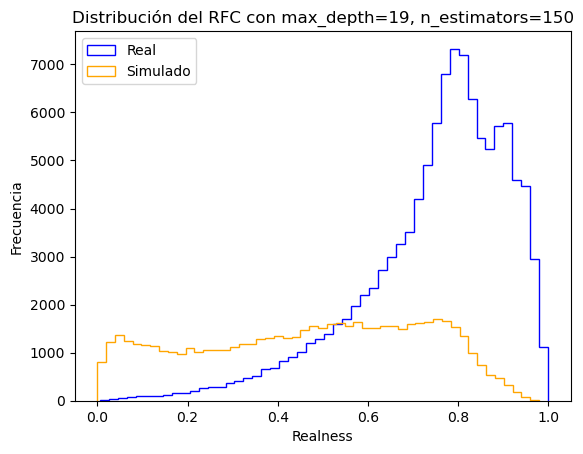

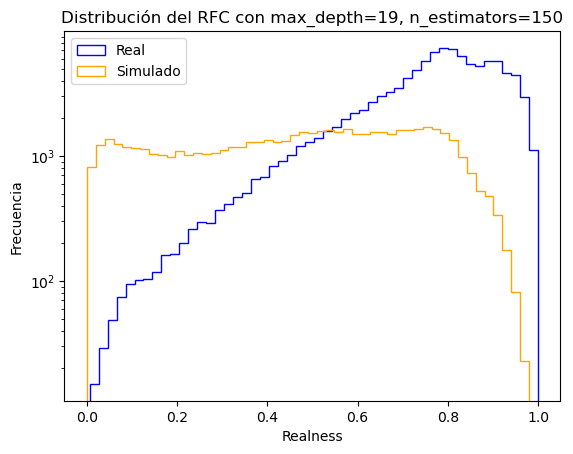

NameError: name 'RocCurveDisplay' is not defined

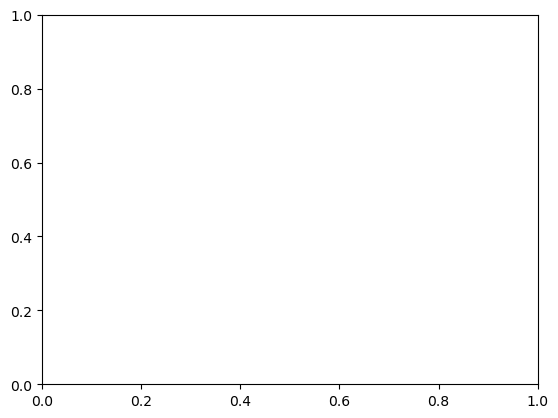

In [3]:
y_pred = (rfrs2.predict_proba(X_test))
realness = y_pred[:,0]                                                                              # Gammaness predicha
label = y_test                                                                                      # Etiqueta real del suceso
    
# Asignamos a cada probabilidad que devuelve el RF la etiqueta real del suceso
realness_real = realness[label == 0]
realness_simu = realness[label == 1]

plt.hist(realness_real, bins=50, histtype=u'step', color = 'blue', label='Real')  
plt.hist(realness_simu, bins=50, histtype=u'step', color = 'orange', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

# Representamos el espectro en escala logarítmica
plt.hist(realness_real, bins=50, histtype=u'step', color = 'blue', label='Real')  
plt.hist(realness_simu, bins=50, histtype=u'step', color = 'orange', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia')
plt.yscale('log')
plt.legend()
plt.show()

ax = plt.gca()
rf_ROC_disp = RocCurveDisplay.from_estimator(rfrs2, X_test, y_test, ax=ax)
plt.show()

feature_importances = pd.Series(rfrs2.feature_importances_, index= X_test.columns).sort_values(ascending=False)
feature_importances.plot.bar()
plt.show()
print(feature_importances)

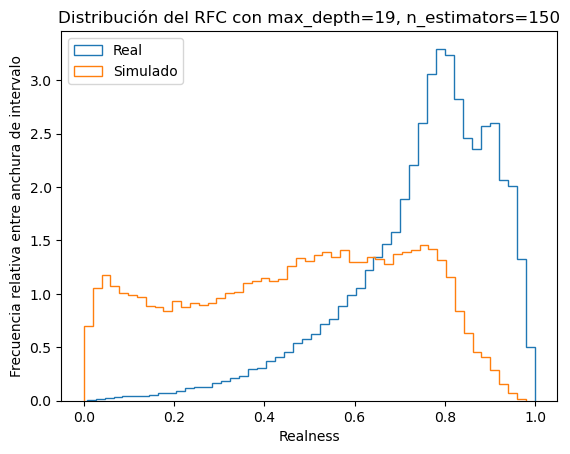

In [4]:
fig = plt.figure()
plt.hist(realness_real, bins=50, density = True, histtype=u'step', label='Real')  
plt.hist(realness_simu, bins=50, density = True, histtype=u'step', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia relativa entre anchura de intervalo')
plt.legend()
plt.show()

fig.savefig('gammamess0.2.png')

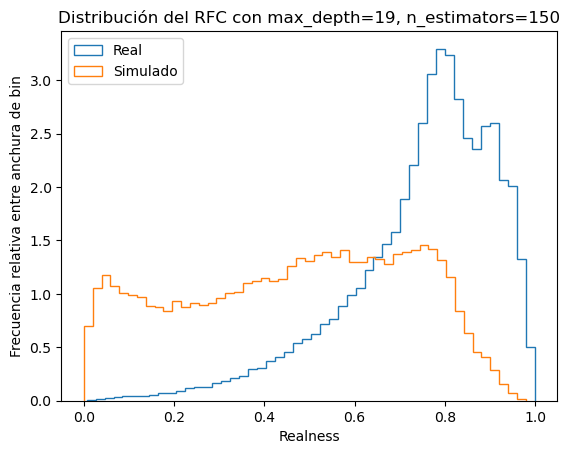

In [5]:
fig = plt.figure()
plt.hist(realness_real, bins=50, density = True, histtype=u'step', label='Real')  
plt.hist(realness_simu, bins=50, density = True, histtype=u'step', label='Simulado')  

plt.title("Distribución del RFC con max_depth=19, n_estimators=150")
plt.xlabel("Realness")
plt.ylabel('Frecuencia relativa entre anchura de bin')
plt.legend()
plt.show()

fig.savefig('gammamess0.22.png')

In [6]:
realness = y_pred[:,0]

X_test.loc[:, "real_true"] = y_test
X_test.loc[:, "realness"] = realness

X_test2 = X_test

# Filtramos los datos para que tengan las mismas dimensiones
X_test2 = X_test2[(X_test2['hillas_width'] > 10**(-4))]

# Separamos los datos en reales y simulados
X_reales = X_test2[(X_test2['real_true'] == 0)]
X_simulados = X_test2[(X_test2['real_true'] == 1)]

# Separamos los reales y simulados en más reales y más simulados
X_simulados_mas = X_simulados[X_simulados['realness'] <= 0.3]
X_simulados_menos = X_simulados[X_simulados['realness'] >= 0.7]
X_reales_mas = X_reales[X_reales['realness'] >= 0.7]
X_reales_menos = X_reales[X_reales['realness'] <= 0.3]

# Eliminamos los parámetros que no interesan
X_simulados_mas = X_simulados_mas.drop("hillas_kurtosis", axis=1)
X_simulados_mas = X_simulados_mas.drop("hillas_skewness", axis=1)
X_simulados_mas = X_simulados_mas.drop("real_true", axis=1)
X_simulados_mas = X_simulados_mas.drop("realness", axis=1)

X_reales_mas = X_reales_mas.drop("hillas_kurtosis", axis=1)
X_reales_mas = X_reales_mas.drop("hillas_skewness", axis=1)
X_reales_mas = X_reales_mas.drop("real_true", axis=1)
X_reales_mas = X_reales_mas.drop("realness", axis=1)

X_simulados_menos = X_simulados_menos.drop("hillas_kurtosis", axis=1)
X_simulados_menos = X_simulados_menos.drop("hillas_skewness", axis=1)
X_simulados_menos = X_simulados_menos.drop("real_true", axis=1)
X_simulados_menos = X_simulados_menos.drop("realness", axis=1)

X_reales_menos = X_reales_menos.drop("hillas_kurtosis", axis=1)
X_reales_menos = X_reales_menos.drop("hillas_skewness", axis=1)
X_reales_menos = X_reales_menos.drop("real_true", axis=1)
X_reales_menos = X_reales_menos.drop("realness", axis=1)

In [7]:
print(X_simulados_mas)
print(X_reales_mas)
print(X_simulados_menos)
print(X_reales_menos)

         hillas_intensity  hillas_length  hillas_width  timing_slope
1015951        211.347635       0.233248      0.039319      0.589088
678716        1628.262052       0.928255      0.147200     -4.825003
153446         335.292547       0.084747      0.062387      0.425805
276314        5720.876457       0.691776      0.219892      6.912380
169095        1850.356308       0.768396      0.114057      9.409647
...                   ...            ...           ...           ...
42987        38952.465004       0.586427      0.267313      5.053438
500195        9907.210168       0.452270      0.236233     10.661786
24830        14479.408887       0.511175      0.202844      2.620431
784910         471.066436       0.262516      0.075952     -0.265501
738826         333.927001       0.143324      0.035828      1.068954

[16776 rows x 4 columns]
         hillas_intensity  hillas_length  hillas_width  timing_slope
2163608       1137.837849       0.593207      0.335883      5.495811
1354715 

In [8]:
titles = ['Intensity', 'Skweness', 'Kurtosis', 'Length', 'Width', 'Time slope']

realness = y_pred[:,0]

# Juntamos todos los datos
data = np.column_stack((X_test, y_test))
data = np.column_stack((data, realness))

# Filtramos los datos para que tengan las mismas dimensiones
data = data[data[:, 4] > 10**(-4)]

# Separamos los datos en reales y simulados
X_reales = data[data[:, 6] == 0]
X_simulados = data[data[:, 6] == 1]

# Separamos los reales y simulados en más reales y más simulados
X_simulados_mas = X_simulados[X_simulados[:,7] <= 0.3]
X_simulados_menos = X_simulados[X_simulados[:,7] >= 0.7]
X_reales_mas = X_reales[X_reales[:,7] >= 0.7]
X_reales_menos = X_reales[X_reales[:,7] <= 0.3]

print(len(X_simulados_mas))
print(len(X_simulados_menos))
print(len(X_reales_mas))
print(len(X_reales_menos))

16776
13254
78136
2252


In [9]:
print(sns.color_palette("Blues").as_hex())
print(sns.color_palette("Reds").as_hex())

['#dbe9f6', '#bad6eb', '#89bedc', '#539ecd', '#2b7bba', '#0b559f']
['#fedbcc', '#fcaf93', '#fc8161', '#f44f39', '#d52221', '#aa1016']


In [10]:
X_simulados_mas = np.column_stack((X_simulados_mas[:,0], X_simulados_mas[:,3], X_simulados_mas[:,4], X_simulados_mas[:,5]))
X_simulados_menos = np.column_stack((X_simulados_menos[:,0], X_simulados_menos[:,3], X_simulados_menos[:,4], X_simulados_menos[:,5]))
X_reales_mas = np.column_stack((X_reales_mas[:,0], X_reales_mas[:,3], X_reales_mas[:,4], X_reales_mas[:,5]))
X_reales_menos = np.column_stack((X_reales_menos[:,0], X_reales_menos[:,3], X_reales_menos[:,4], X_reales_menos[:,5]))

/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as

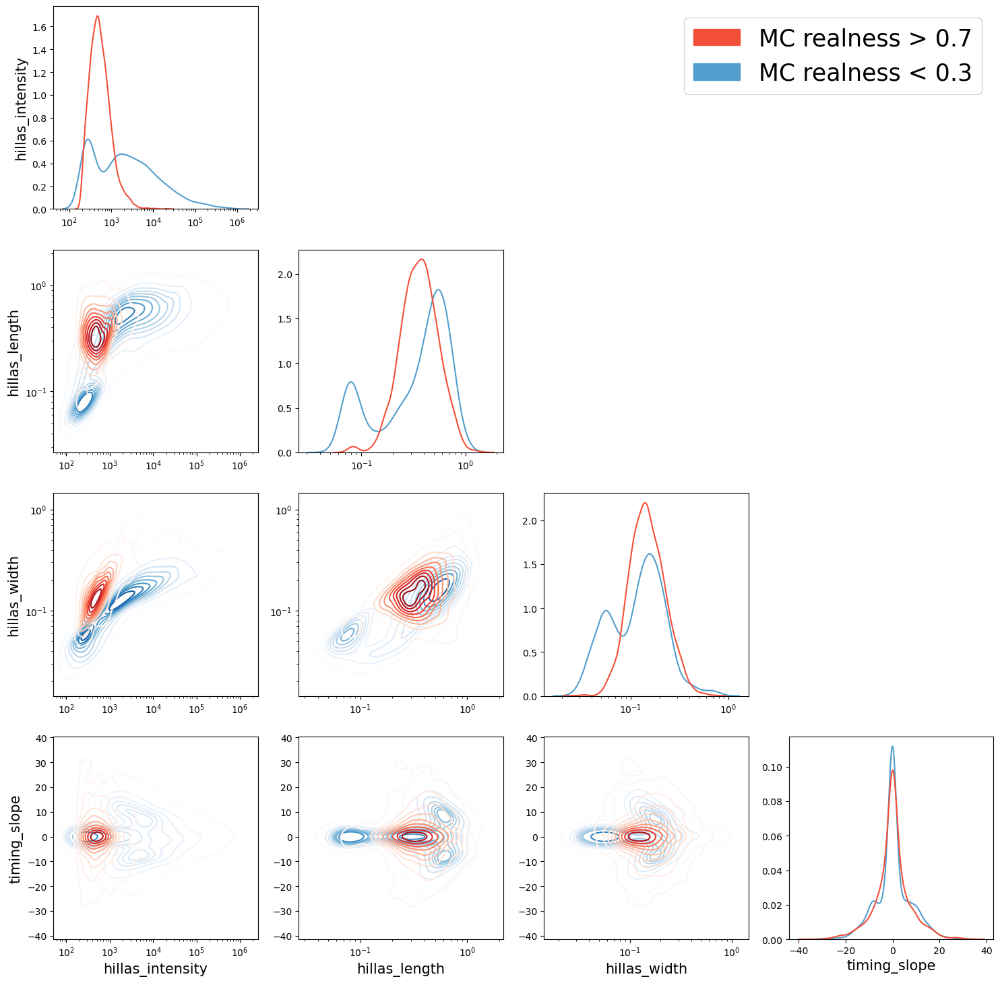

In [22]:
titles = ['hillas_intensity', 'hillas_length', 'hillas_width', 'timing_slope']

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

red_patch = mpatches.Patch(color='#f44f39', label='MC realness > 0.7')
blue_patch = mpatches.Patch(color='#539ecd', label='MC realness < 0.3')

# Crear una cuadrícula de subplots 6x6
fig = plt.figure(figsize=(18, 18))

# Iterar sobre cada subplot y llamar a la función con los datos correspondientes
for i in range(4):
    for j in range(i+1):
        ax = fig.add_subplot(4, 4, i * 4 + j + 1)
        
        # Establecer títulos de los ejes x e y
        xlabel = titles[j]
        ylabel = titles[i]

        if np.all(X_simulados_mas[:-13751, j] > 0) and np.all(X_simulados_menos[:-10615, j] > 0):
            ax.set_xscale('log')
        if np.all(X_simulados_mas[:-10615, i] > 0) and np.all(X_simulados_menos[:-10615, i] > 0):
            ax.set_yscale('log')
        
        # Representar los datos
        if i == j:
            sns.kdeplot(X_simulados_mas[:-13751, j], color='#539ecd')
            sns.kdeplot(X_simulados_menos[:-10615, j], color='#f44f39')
            ax.set_yscale('linear')
            ax.set_ylabel("")
        else:
            sns.kdeplot(x=X_simulados_mas[:-13751, j], y=X_simulados_mas[:-13751, i], cmap='Blues', thresh=0.02, ax=ax)
            sns.kdeplot(x=X_simulados_menos[:-10615, j], y=X_simulados_menos[:-10615, i], cmap='Reds', thresh=0.02, ax=ax)
            
        # Añadir títulos solo a los subplots del borde
        if i == 3:
            ax.set_xlabel(f"{xlabel}", fontsize = 15)
        if j == 0:
            ax.set_ylabel(f"{ylabel}", fontsize = 15)
        
#plt.suptitle('Comparación de los parámetros entre los eventos simulados', fontsize = 20)
plt.legend(handles=[red_patch, blue_patch], loc='upper right', bbox_to_anchor=(1, 4.6), fontsize = 25)
#plt.tight_layout()
plt.show()

fig.savefig('Comparación simulados6.png')

/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/gamma5/users/inimar2/anaconda3/envs/lst/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as

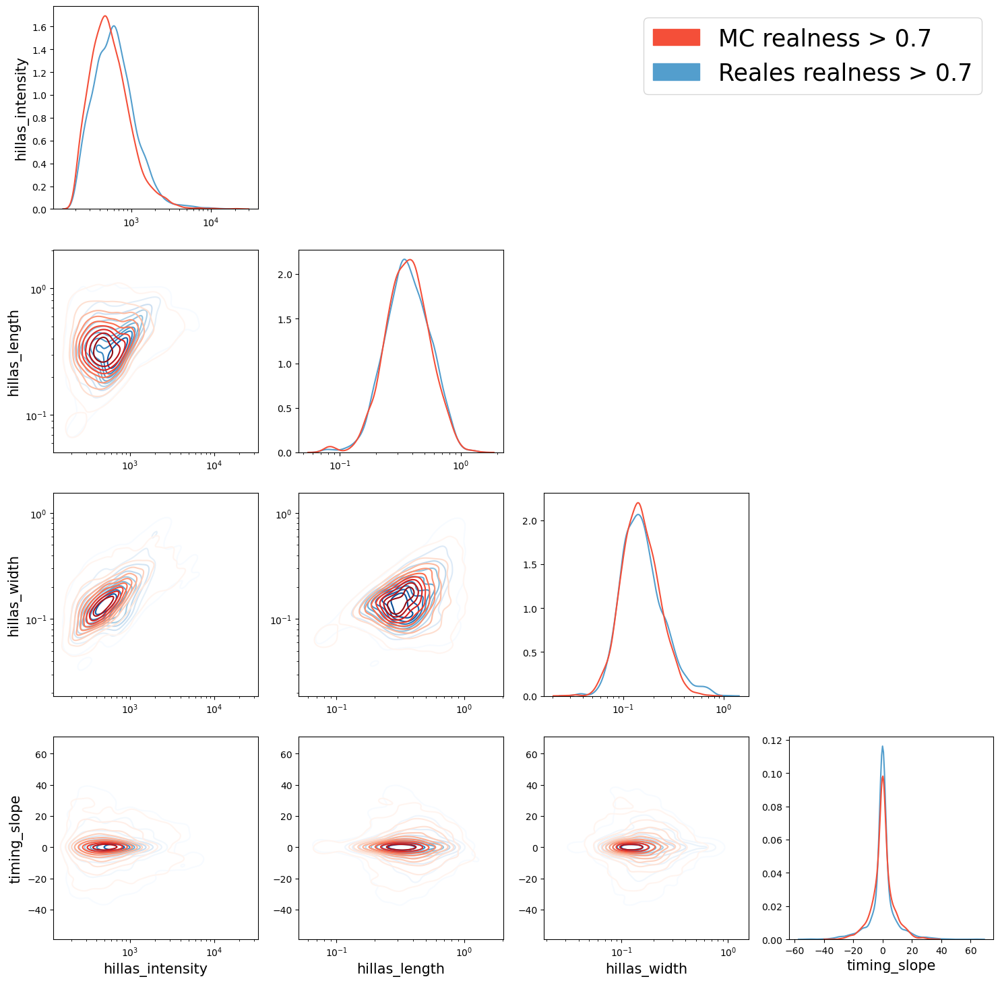

In [23]:
titles = ['hillas_intensity', 'hillas_length', 'hillas_width', 'timing_slope']

import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

red_patch = mpatches.Patch(color='#f44f39', label='MC realness > 0.7')
blue_patch = mpatches.Patch(color='#539ecd', label='Reales realness > 0.7')

# Crear una cuadrícula de subplots 6x6
fig = plt.figure(figsize=(18, 18))

# Iterar sobre cada subplot y llamar a la función con los datos correspondientes
for i in range(4):
    for j in range(i+1):
        ax = fig.add_subplot(4, 4, i * 4 + j + 1)
        
        # Establecer títulos de los ejes x e y
        xlabel = titles[j]
        ylabel = titles[i]

        if np.all(X_reales_mas[:-75498, j] > 0) and np.all(X_simulados_menos[:-10615, j] > 0):
            ax.set_xscale('log')
        if np.all(X_reales_mas[:-75498, i] > 0) and np.all(X_simulados_menos[:-10615, i] > 0):
            ax.set_yscale('log')
        
        # Representar los datos
        if i == j:
            sns.kdeplot(X_reales_mas[:-75498, j], color='#539ecd')
            sns.kdeplot(X_simulados_menos[:-10615, j], color='#f44f39')
            ax.set_yscale('linear')
            ax.set_ylabel("")
        else:
            sns.kdeplot(x=X_reales_mas[:-75498, j], y=X_reales_mas[:-75498, i], cmap='Blues', thresh=0.02, ax=ax)
            sns.kdeplot(x=X_simulados_menos[:-10615, j], y=X_simulados_menos[:-10615, i], cmap='Reds', thresh=0.02, ax=ax)

        # Añadir títulos solo a los subplots del borde
        if i == 3:
            ax.set_xlabel(f"{xlabel}", fontsize = 15)
        if j == 0:
            ax.set_ylabel(f"{ylabel}", fontsize = 15)
        
#plt.suptitle('Comparación de los parámetros entre los eventos simulados', fontsize = 30)
plt.legend(handles=[red_patch, blue_patch], loc='upper right', bbox_to_anchor=(1, 4.6), fontsize = 25)
#plt.tight_layout()
plt.show()

fig.savefig('Comparación reales6.png')